<hr style="height:2px; width:100%">

<h1 style="color:#32611D">Task 7HD: SIG 734 Data Wrangling - Data Mining Challenge </h1>

<p style="color:#551D61; font-size:16px";>
    Name: &emsp;&emsp;&emsp; Suraj Mathew Thomas<br>
    Student ID: &ensp; S223509398<br>
    Email ID: &emsp;&ensp;&ensp; s223509398@deakin.edu.au<br><br>
</p>

<hr style="height:2px; width:100%">

<h2 style="color:#336699"> Introduction</h2>

<p style="color:#20568B; font-size:15px";>
Data Mining of 5 datasets from the NHANES study. We will individually study the datasets and also perform a combined analysis.Since this is a HD Task not much information or questions are given regarding what to find. The Five Datasets that are downloaded from the given link are </p>

[Link - Source Data Sets](https://wwwn.cdc.gov/nchs/nhanes/continuousnhanes/default.aspx?Cycle=2017-2020)

* **1) Demographic Data**
* **2) Cholestrol Data**
* **3) Body Measurement Vitals Data**
* **4) Diet Behavioural Data**
* **5) Blood Pressure Data**

<p style="color:#20568B; font-size:15px";>
The plots are plotted using plotly as well as Bokeh packages (to make it interactive). Since some of the visuals of these interactive plot are not visible when loaded and only when the entire workbook is run, there are pictures of these plots that are pasted below of the interactive plot. In case you would want to interact with the plot and look are the tooltips and their data, you would need to restart the kernel and run all the cells. </p>

<p style="color:#20568B; font-size:15px";>
Some of the pre-processing and data wrangling techniques used below are transformation, extraction of subset of data for analysis, aggregation, filtering, sorting, missing value analysis and ingestion using measures of central tendency where applicable, column transformation and many more.</p>

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 1: Importing the necessary basic libraries</h2>

In [2]:
#pip install squarify

Note: you may need to restart the kernel to use updated packages.


In [535]:
#pip install jupyter_bokeh

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 14.7 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 47.6 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 5.5 MB/s eta 0:00:00
  Attempting uninstall: bokeh
    Found existing installation: bokeh 2.4.3
    Uninstalling bokeh-2.4.3:
      Successfully uninstalled bokeh-2.4.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
panel 0.14.3 requires bokeh<2.5.0,>=2.4.0, but you have bokeh 3.3.4 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [536]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import cm
import squarify
import scipy.stats as stats
import statistics as st
from scipy.stats.mstats import mquantiles
from scipy.stats import iqr
from scipy.stats import pearsonr
from collections import Counter
from numpy import where
from IPython.display import Image  
from sklearn import metrics
from os import system
from scipy.stats import zscore
import statsmodels.formula.api as smf
from bokeh.plotting import figure, show
from bokeh.io import output_notebook

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 2: Let us take Data Set 1 - Demographic Data</h2>

In [55]:
df_demographic = pd.read_sas('P_DEMO.xpt')
df_demographic.head()

,SEQN,SDDSRVYR,RIDSTATR,RIAGENDR,RIDAGEYR,RIDAGEMN,RIDRETH1,RIDRETH3,RIDEXMON,DMDBORN4,...,FIAINTRP,MIALANG,MIAPROXY,MIAINTRP,AIALANGA,WTINTPRP,WTMECPRP,SDMVPSU,SDMVSTRA,INDFMPIR
0,109263.0,66.0,2.0,1.0,2.0,NaN,5.0,6.0,2.0,1.0,...,2.0,NaN,NaN,NaN,NaN,7891.762435,8.951816e+03,3.0,156.0,4.66
1,109264.0,66.0,2.0,2.0,13.0,NaN,1.0,1.0,2.0,1.0,...,2.0,1.0,2.0,2.0,1.0,11689.747264,1.227116e+04,1.0,155.0,0.83
2,109265.0,66.0,2.0,1.0,2.0,NaN,3.0,3.0,2.0,1.0,...,2.0,NaN,NaN,NaN,NaN,16273.825939,1.665876e+04,1.0,157.0,3.06
3,109266.0,66.0,2.0,2.0,29.0,NaN,5.0,6.0,2.0,2.0,...,2.0,1.0,2.0,2.0,1.0,7825.646112,8.154968e+03,2.0,168.0,5.00
4,109267.0,66.0,1.0,2.0,21.0,NaN,2.0,2.0,NaN,2.0,...,2.0,NaN,NaN,NaN,NaN,26379.991724,5.397605e-79,1.0,156.0,5.00


In [56]:
#The number of rows and columns in the demographic dataset
print('The number of rows (observations) is',df_demographic.shape[0],'\n''The number of columns (variables) is',df_demographic.shape[1])

The number of rows (observations) is 15560 
The number of columns (variables) is 29


### Column Descriptions and their Values - To Assess and Choose only the required Columns

* **SEQN - Respondent sequence number**
* SDDSRVYR - Data release cycle
* RIDSTATR - Interview/Examination status
* **RIAGENDR - Gender**
* **RIDAGEYR - Age in years at screening**
* **RIDAGEMN - Age in months at screening - 0 to 24 mos**
* RIDRETH1 - Race/Hispanic origin
* RIDRETH3 - Race/Hispanic origin w/ NH Asian
* RIDEXMON - Six-month time period
* **DMDBORN4 - Country of birth**
* DMDYRUSZ - Length of time in US
* **DMDEDUC2 - Education level - Adults 20+**
* **DMDMARTZ - Marital status**
* RIDEXPRG - Pregnancy status at exam
* SIALANG - Language of SP Interview
* SIAPROXY - Proxy used in SP Interview?
* SIAINTRP - Interpreter used in SP Interview?
* FIALANG - Language of Family Interview
* FIAPROXY - Proxy used in Family Interview?
* FIAINTRP - Interpreter used in Family Interview?
* MIALANG - Language of MEC Interview
* MIAPROXY - Proxy used in MEC Interview?
* MIAINTRP - Interpreter used in MEC Interview?
* AIALANGA - Language of ACASI Interview
* WTINTPRP - Full sample interview weight
* WTMECPRP - Full sample MEC exam weight
* SDMVPSU - Masked variance pseudo-PSU
* SDMVSTRA - Masked variance pseudo-stratum
* **INDFMPIR - Ratio of family income to poverty**

National Health and Nutrition Examination Survey
2017-March 2020 Data Documentation, Codebook, and Frequencies
Demographic Variables and Sample Weights (P_DEMO)
Data File: P_DEMO.xpt

<p style="color:#20568B; font-size:16px";>
We will keep only the columns that are highlighted in bold for our further analysis. We will be reducing the variables from 29 variables to 8 key variables</p>

<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2a: Keeping only relevant columns and values</h3>

In [57]:
df_demographic_2 = df_demographic.drop(['SDDSRVYR', 'RIDSTATR','RIDRETH1', 'RIDRETH3','RIDEXMON', 'DMDYRUSZ' ,'RIDEXPRG' ,'SIALANG' ,'SIAPROXY',
                    'SIAINTRP' ,'FIALANG' ,'FIAPROXY' ,'FIAINTRP' , 'MIALANG', 'MIAPROXY', 'MIAINTRP', 'AIALANGA', 
                    'WTINTPRP', 'WTMECPRP', 'SDMVPSU', 'SDMVSTRA'], axis=1)
df_demographic_2.head()

,SEQN,RIAGENDR,RIDAGEYR,RIDAGEMN,DMDBORN4,DMDEDUC2,DMDMARTZ,INDFMPIR
0,109263.0,1.0,2.0,NaN,1.0,NaN,NaN,4.66
1,109264.0,2.0,13.0,NaN,1.0,NaN,NaN,0.83
2,109265.0,1.0,2.0,NaN,1.0,NaN,NaN,3.06
3,109266.0,2.0,29.0,NaN,2.0,5.0,3.0,5.00
4,109267.0,2.0,21.0,NaN,2.0,4.0,3.0,5.00


<p style="color:#20568B; font-size:16px";>
Since the column names are not user friendly and readable unless we have a reference table, we will rename the columns for better understand and easy interpretation</p>

In [58]:
new_column_names = ['SEQN_NO', 'GENDER', 'AGE_YR', 'AGE_MN', 'BIRTH_COUNTRY', 'EDU_LVL', 'MAR_STAT', 'INCOM_RATIO']
df_demographic_2.columns = new_column_names
print(df_demographic_2.shape)
df_demographic_2.head()

(15560, 8)


,SEQN_NO,GENDER,AGE_YR,AGE_MN,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
0,109263.0,1.0,2.0,NaN,1.0,NaN,NaN,4.66
1,109264.0,2.0,13.0,NaN,1.0,NaN,NaN,0.83
2,109265.0,1.0,2.0,NaN,1.0,NaN,NaN,3.06
3,109266.0,2.0,29.0,NaN,2.0,5.0,3.0,5.00
4,109267.0,2.0,21.0,NaN,2.0,4.0,3.0,5.00


<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2b: Data Type analysis, change and getting the modified dataframe analysis ready</h3>

In [59]:
df_demographic_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15560 entries, 0 to 15559
Data columns (total 8 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEQN_NO        15560 non-null  float64
 1   GENDER         15560 non-null  float64
 2   AGE_YR         15560 non-null  float64
 3   AGE_MN         987 non-null    float64
 4   BIRTH_COUNTRY  15560 non-null  float64
 5   EDU_LVL        9232 non-null   float64
 6   MAR_STAT       9232 non-null   float64
 7   INCOM_RATIO    13359 non-null  float64
dtypes: float64(8)
memory usage: 972.6 KB


In [60]:
df_demographic_2[['INCOM_RATIO','AGE_YR', 'AGE_MN']] = df_demographic_2[['INCOM_RATIO','AGE_YR', 'AGE_MN']].round(2)
df_demographic_2[['SEQN_NO', 'GENDER', 'BIRTH_COUNTRY']] = df_demographic_2[['SEQN_NO', 'GENDER', 'BIRTH_COUNTRY']].astype('int')
df_demographic_2.head()

,SEQN_NO,GENDER,AGE_YR,AGE_MN,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
0,109263,1,2.0,NaN,1,NaN,NaN,4.66
1,109264,2,13.0,NaN,1,NaN,NaN,0.83
2,109265,1,2.0,NaN,1,NaN,NaN,3.06
3,109266,2,29.0,NaN,2,5.0,3.0,5.00
4,109267,2,21.0,NaN,2,4.0,3.0,5.00


<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2c: Checking for which columns have NaN values </h3>

In [61]:
#Checking the number of NAN values in each of the 8 columns.
df_demographic_2.isna().apply([np.sum])

,SEQN_NO,GENDER,AGE_YR,AGE_MN,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
sum,0,0,0,14573,0,6328,6328,2201


<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2d: Converting the Month Column to the Years equivalent and appending it to the Years columns. Post conversion, we will drop the Month Column </h3>

<p style="color:#20568B; font-size:16px";>
We can see that the Age in Months, Education Level, Marital Status and Income Ratio columns having 'NaN' values</p>


<p style="color:#20568B; font-size:16px";>
The Maximum number of NaN values is found in the Age Month column. Since majority of the values are NaN, we can look to convert the ones that exist to a decimal equivalent of a year and add/append that to the Year column. Once we do that, we can eliminate the the Month column completely</p>

<p style="color:#20568B; font-size:16px";>
Another noteworthy observation is that the education level and marital status have the same NaN counts. This could be becase these columns were introducted later in the data collection process and the initial 6328 people were not subjected to these questions.</p>

In [62]:
month_nan_locate = df_demographic_2.iloc[:,3].isna() # Identifying if the value in the month column is NaN - True or False
df_demographic_2.loc[~month_nan_locate, 'AGE_YR'] = df_demographic_2.loc[~month_nan_locate, 'AGE_MN']/12 #The age year column is being appended with the decimal equivalent of the month. 
df_demographic_2.AGE_YR = df_demographic_2.AGE_YR.round(2) 
df_demographic_2[80:95] #Checking if the conversions have taken place

,SEQN_NO,GENDER,AGE_YR,AGE_MN,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
80,109343,1,69.00,NaN,1,3.0,1.0,4.31
81,109344,1,1.92,23.0,1,NaN,NaN,0.33
82,109345,1,0.42,5.0,1,NaN,NaN,0.38
83,109346,2,23.00,NaN,1,3.0,3.0,1.15
84,109347,1,2.00,NaN,1,NaN,NaN,0.73
85,109348,2,63.00,NaN,1,5.0,1.0,5.00
86,109349,2,47.00,NaN,1,5.0,1.0,NaN
87,109350,1,59.00,NaN,1,2.0,3.0,1.25
88,109351,1,58.00,NaN,1,3.0,2.0,0.92
89,109352,1,10.00,NaN,1,NaN,NaN,5.00


<p style="color:#20568B; font-size:16px";>
Dropping the Month Column post conversion.</p>

In [63]:
df_demographic_2.drop('AGE_MN', axis=1, inplace=True)
df_demographic_2.head()

,SEQN_NO,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
0,109263,1,2.0,1,NaN,NaN,4.66
1,109264,2,13.0,1,NaN,NaN,0.83
2,109265,1,2.0,1,NaN,NaN,3.06
3,109266,2,29.0,2,5.0,3.0,5.00
4,109267,2,21.0,2,4.0,3.0,5.00


<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2e: To check if the missing values in the columns education level and marital status are missing for the same set of individuals </h3>

In [64]:
# Analysing the observations Education Level and Marital Status to confim if the same people have missing values.

edu_lvl_nan = df_demographic_2.loc[:, 'EDU_LVL'].isna() #Finding which are NaN and which have values in EDU_LVL column
mar_stat_nan = df_demographic_2.loc[:, 'MAR_STAT'].isna()#Finding which are NaN and which have values in MAR_STAT column

edu_mar_nan = df_demographic_2.loc[:, ['EDU_LVL', 'MAR_STAT']].isna() # Both Columns together "NaN" values
edu_mar_del = df_demographic_2.loc[mar_stat_nan, ['EDU_LVL', 'MAR_STAT']] #6328 rows

print(edu_mar_nan.value_counts(), '\n')
print('Compare the columns: ', edu_mar_nan['EDU_LVL'].equals(edu_mar_nan['MAR_STAT']))

EDU_LVL  MAR_STAT
False    False       9232
True     True        6328
dtype: int64 

Compare the columns:  True


<p style="color:#20568B; font-size:16px";>
We can conclude that the same set of individuals have missing values in bothe education level and marital status. Like predicted before these two columns would have been introduced later in the data capture process.</p>

<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2f: To check for duplicates </h3>

In [65]:
is_duplicate = df_demographic_2.duplicated() #Checking to see if there are any duplicate rows in the dataset
print('Number of duplicate rows = %d' % (is_duplicate.sum()))

Number of duplicate rows = 0


In [66]:
# Five point summary
df_demographic_2.describe().T

,count,mean,std,min,25%,50%,75%,max
SEQN_NO,15560.0,117042.500000,4491.929430,109263.0,113152.75,117042.50,120932.25,124822.0
GENDER,15560.0,1.503792,0.500002,1.0,1.00,2.00,2.00,2.0
AGE_YR,15560.0,33.770826,25.283545,0.0,10.00,30.00,56.00,80.0
BIRTH_COUNTRY,15560.0,1.230206,1.728083,1.0,1.00,1.00,1.00,99.0
EDU_LVL,9232.0,3.551993,1.214109,1.0,3.00,4.00,4.00,9.0
MAR_STAT,9232.0,1.708622,2.755878,1.0,1.00,1.00,2.00,99.0
INCOM_RATIO,13359.0,2.405937,1.634346,0.0,1.02,1.96,3.88,5.0


<h style="height:1px; width:100%">

<h3 style="color:#1D3361"> Step 2g: Changing the columns that have categorical observations represented in numbers to their category equivalent for understanding and descriptive analytics </h3>

* Gender            (GENDER)  - 1 Male | 2 Female
* Country of Birth  (BIRTH_COUNTRY) - 1 USA | 2 Others| 77 Refused | 99 Dont Know | (blank) Missing 
* Education Level   (EDU_LVL) - 1 Less than 9th grade| 2 9-11th grade (Includes 12th grade with no diploma)	|3 High school graduate/GED or equivalent | 4 Some college or AA degree	| 5 College graduate or above | 7 Refused | 9 Don't Know| (blank) Missing 
* Marital Status    (MAR_STAT) - 1 Married/Partner | 2 Widowed/Divorced | 3 Never Married | 77 Refused | 99 Dont Know | (blank) Missing

#### We will combine Refused | Missing | Dont Know under one banner/category "Unknown"

In [67]:
# Gender Column Manipulation
males = df_demographic_2.GENDER == 1
females = df_demographic_2.GENDER == 2
df_demographic_2.loc[males, 'GENDER'] = 'Male' #Males identity
df_demographic_2.loc[females, 'GENDER'] = 'Female' #Not Male identity (Female identity)

# Updating the Birth Country with the categories. Birth Country does not have any missing data.
df_demographic_2.loc[df_demographic_2.BIRTH_COUNTRY == 1, 'BIRTH_COUNTRY'] = 'USA'
df_demographic_2.loc[df_demographic_2.BIRTH_COUNTRY == 2, 'BIRTH_COUNTRY'] = 'Others'
df_demographic_2.loc[df_demographic_2.BIRTH_COUNTRY == 77, 'BIRTH_COUNTRY'] = 'Unknown'
df_demographic_2.loc[df_demographic_2.BIRTH_COUNTRY == 99, 'BIRTH_COUNTRY'] = 'Unknown'

# Education Level Column Manipulation
df_demographic_2.loc[df_demographic_2.EDU_LVL == 1, 'EDU_LVL'] = '9th Grade'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 2, 'EDU_LVL'] = '12th Grade'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 3, 'EDU_LVL'] = 'High School Grad'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 4, 'EDU_LVL'] = 'AA Degree'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 5, 'EDU_LVL'] = 'College Grad and above'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 7, 'EDU_LVL'] = 'Unknown'
df_demographic_2.loc[df_demographic_2.EDU_LVL == 9, 'EDU_LVL'] = 'Unknown'
df_demographic_2.loc[df_demographic_2.EDU_LVL.isna(), 'EDU_LVL'] = 'Unknown'

# Marital Status Column Manipulation 
df_demographic_2.loc[df_demographic_2.MAR_STAT == 1, 'MAR_STAT'] = 'Married/Partner'
df_demographic_2.loc[df_demographic_2.MAR_STAT == 2, 'MAR_STAT'] = 'Widowed/Divorced'
df_demographic_2.loc[df_demographic_2.MAR_STAT == 3, 'MAR_STAT'] = 'Never Married'
df_demographic_2.loc[df_demographic_2.MAR_STAT == 77, 'MAR_STAT'] = 'Unknown'
df_demographic_2.loc[df_demographic_2.MAR_STAT == 99, 'MAR_STAT'] = 'Unknown'
df_demographic_2.loc[df_demographic_2.MAR_STAT.isna(), 'MAR_STAT'] = 'Unknown'

df_demographic_2.head()

,SEQN_NO,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
0,109263,Male,2.0,USA,Unknown,Unknown,4.66
1,109264,Female,13.0,USA,Unknown,Unknown,0.83
2,109265,Male,2.0,USA,Unknown,Unknown,3.06
3,109266,Female,29.0,Others,College Grad and above,Never Married,5.00
4,109267,Female,21.0,Others,AA Degree,Never Married,5.00


In [68]:
#Missing Value Analysis - Now we can see that the Age Year has no missing values as the month column was converted and joined.
missing_values=pd.DataFrame(df_demographic_2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_demographic_2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN_NO,0,0.00
1,GENDER,0,0.00
2,AGE_YR,0,0.00
3,BIRTH_COUNTRY,0,0.00
4,EDU_LVL,0,0.00
5,MAR_STAT,0,0.00
6,INCOM_RATIO,2201,14.15


In [69]:
#Unique values in each of the columns of Object Datatype and the number of observations 
#These are categorical variables
for column in df_demographic_2.columns:
    if df_demographic_2[column].dtype == 'object':
        print(column.upper(),': ',df_demographic_2[column].nunique())
        print(df_demographic_2[column].value_counts().sort_values())
        print('\n')

GENDER :  2
Male      7721
Female    7839
Name: GENDER, dtype: int64


BIRTH_COUNTRY :  3
Unknown        7
Others      3028
USA        12525
Name: BIRTH_COUNTRY, dtype: int64


EDU_LVL :  6
9th Grade                  719
12th Grade                1041
High School Grad          2225
College Grad and above    2257
AA Degree                 2975
Unknown                   6343
Name: EDU_LVL, dtype: int64


MAR_STAT :  4
Never Married       1795
Widowed/Divorced    2148
Married/Partner     5279
Unknown             6338
Name: MAR_STAT, dtype: int64




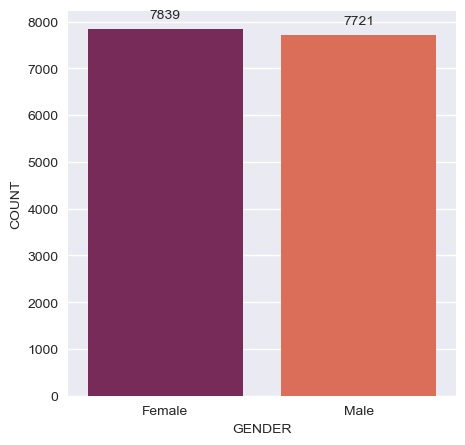

In [77]:
#Visual Representation of Categorical Variables in the dataset
#GENDER
plot1 = pd.DataFrame(df_demographic_2['GENDER'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["GENDER","COUNT"]
fig_dims = (5, 5)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='GENDER',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

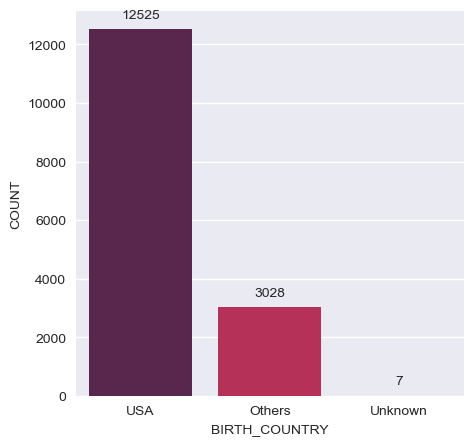

In [78]:
#Visual Representation of Categorical Variables in the dataset
#BIRTH COUNTRY
plot1 = pd.DataFrame(df_demographic_2['BIRTH_COUNTRY'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["BIRTH_COUNTRY","COUNT"]
fig_dims = (5, 5)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='BIRTH_COUNTRY',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

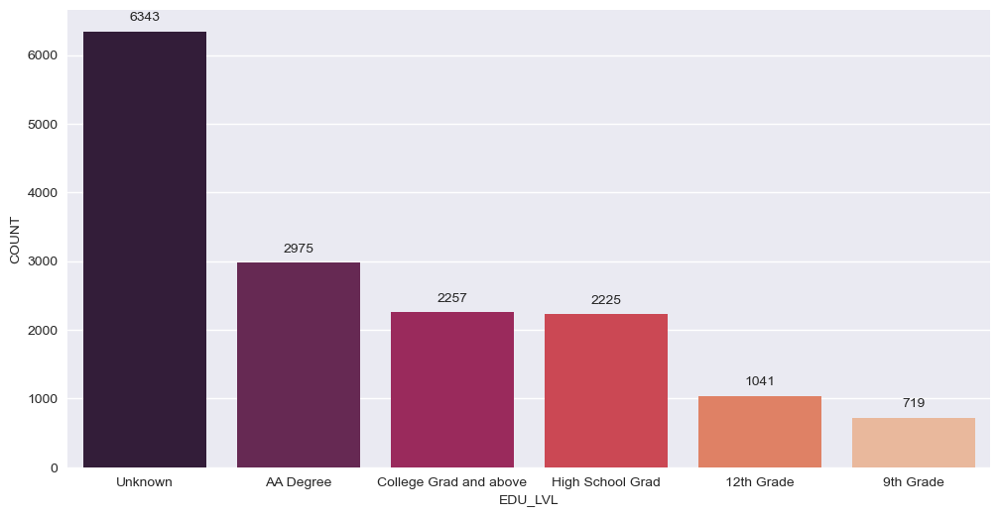

In [83]:
#Visual Representation of Categorical Variables in the dataset
#EDUCATION LEVEL
plot1 = pd.DataFrame(df_demographic_2['EDU_LVL'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["EDU_LVL","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='EDU_LVL',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

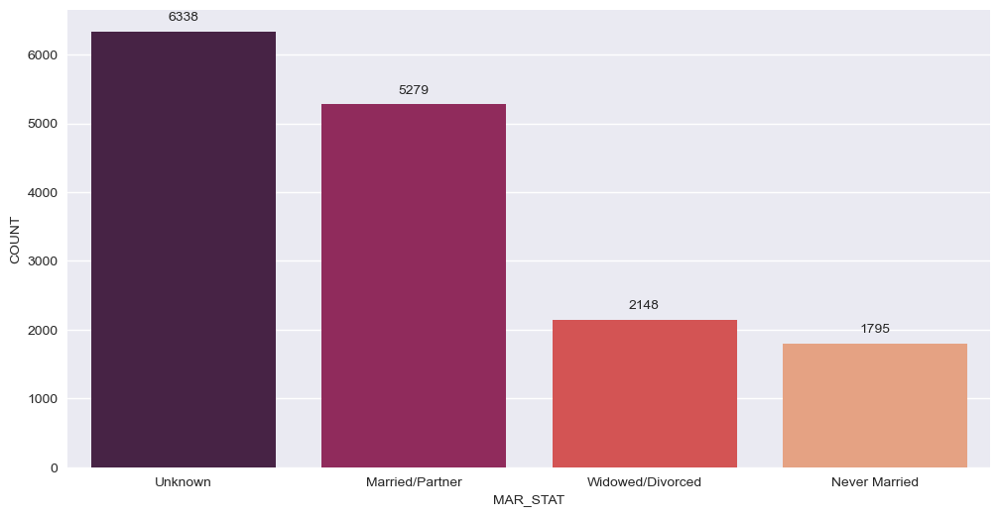

In [84]:
#Visual Representation of Categorical Variables in the dataset
#MARITAL STATUS
plot1 = pd.DataFrame(df_demographic_2['MAR_STAT'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MAR_STAT","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MAR_STAT',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

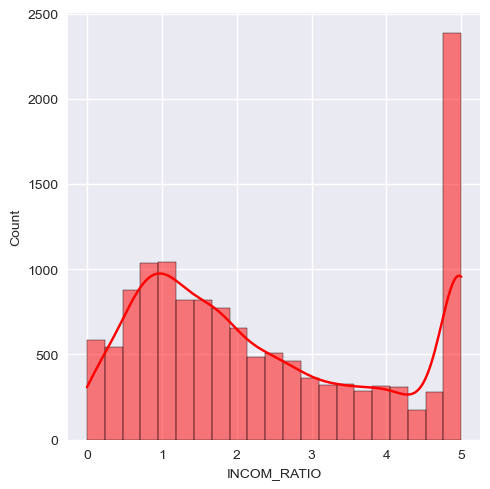

In [93]:
plt.figure(figsize = (5,5))
feature_list = df_demographic_2['INCOM_RATIO']
sns.histplot(x = feature_list,color="red",kde=True)
plt.tight_layout()

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 3: Let us take Data Set 2 - Cholestrol Data</h2>

In [96]:
df_chol = pd.read_sas('P_TCHOL.xpt')
print(df_chol.shape) # Checking if the full dataset was imported. 
df_chol.head()

(12198, 3)


,SEQN,LBXTC,LBDTCSI
0,109264.0,166.0,4.29
1,109266.0,195.0,5.04
2,109270.0,103.0,2.66
3,109271.0,147.0,3.80
4,109273.0,164.0,4.24


In [97]:
#The number of rows and columns in the demographic dataset
print('The number of rows (observations) is',df_chol.shape[0],'\n''The number of columns (variables) is',df_chol.shape[1])

The number of rows (observations) is 12198 
The number of columns (variables) is 3


### Column Descriptions and their Values - To Assess and Choose only the required Columns

* SEQN - Respondent sequence number.
* LBXTC Total Cholesterol **(mg/dL)**
* LBDTCSI Total **Cholesterol (mmol/L)**

[Total Cholesterol](https://www.medicalnewstoday.com/articles/how-to-calculate-total-cholesterol) is a measure that combines, HDL (high-density lipoprotein) cholesterol,  LDL (low-density lipoprotein) cholesterol, and other lipid components and is a measure to assess the risk of a potential heart disease.

Total [Cholesterol Levels](https://www.verywellhealth.com/cholesterol-levels-by-age-chart-5190176) by Age: Normal, Borderline, and High:

Age/Sex | Classification | Total Cholesterol
--------|----------------|------------------- 
Males 19 and younger | Normal | Less than 170 mg/dL
 | Borderline | 170–199 mg/dL
 | High |Greater than or equal to 200 mg/dL
Males 20 and older | Normal | 125–200 mg/dL
 | Borderline | 200–239 mg/dL
 | High | Greater than or equal to 239 mg/dL
Females 19 and younger | Normal | Less than 170 mg/dL
 | Borderline | 170–199 mg/dL
 | High | Greater than or equal to 200 mg/dL
Females 20 and older | Normal | 125–200 mg/dL
 | Borderline | 200–239 mg/dL
 | High | Greater than or equal to 239 mg/dL
 
We only need the one column. Dropping `LBDTCSI`.

National Health and Nutrition Examination Survey
2017-March 2020 Data Documentation, Codebook, and Frequencies

In [98]:
df_chol2 = df_chol.drop('LBDTCSI', axis=1)
df_chol2.rename(columns={'LBXTC': 'CHOL_mg'}, inplace=True)
print(df_chol2.shape)
df_chol2.head()

(12198, 2)


,SEQN,CHOL_mg
0,109264.0,166.0
1,109266.0,195.0
2,109270.0,103.0
3,109271.0,147.0
4,109273.0,164.0


In [99]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_chol2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_chol2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,CHOL_mg,1370,11.23


In [100]:
#Dropping the NA values 
df_chol2.dropna(inplace=True)
print(df_chol2.shape)
df_chol2.isna().apply([np.sum])

(10828, 2)


,SEQN,CHOL_mg
sum,0,0


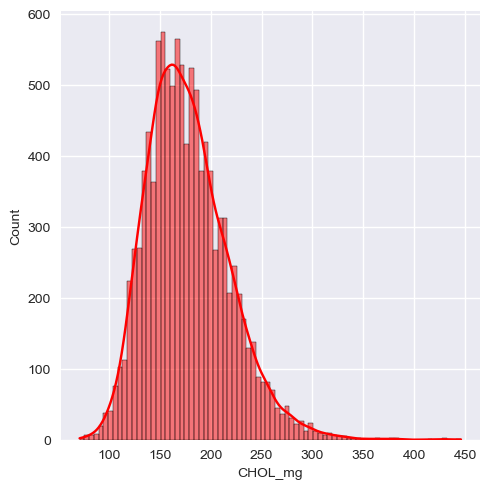

In [101]:
#Visualizing the distribution 
plt.figure(figsize = (5,5))
feature_list = df_chol2['CHOL_mg']
sns.histplot(x = feature_list,color="red",kde=True)
plt.tight_layout()

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 3: Let us take Data Set 3 - Body Measurement Data</h2>

In [143]:
df_body = pd.read_sas('P_BMX.xpt')
print(df_body.shape) # Checking if full dataset was imported. 
df_body.head()

(14300, 22)


,SEQN,BMDSTATS,BMXWT,BMIWT,BMXRECUM,BMIRECUM,BMXHEAD,BMIHEAD,BMXHT,BMIHT,...,BMXLEG,BMILEG,BMXARML,BMIARML,BMXARMC,BMIARMC,BMXWAIST,BMIWAIST,BMXHIP,BMIHIP
0,109263.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,109264.0,1.0,42.2,NaN,NaN,NaN,NaN,NaN,154.7,NaN,...,36.3,NaN,33.8,NaN,22.7,NaN,63.8,NaN,85.0,NaN
2,109265.0,1.0,12.0,NaN,91.6,NaN,NaN,NaN,89.3,NaN,...,NaN,NaN,18.6,NaN,14.8,NaN,41.2,NaN,NaN,NaN
3,109266.0,1.0,97.1,NaN,NaN,NaN,NaN,NaN,160.2,NaN,...,40.8,NaN,34.7,NaN,35.8,NaN,117.9,NaN,126.1,NaN
4,109269.0,3.0,13.6,NaN,90.9,NaN,NaN,NaN,NaN,1.0,...,NaN,NaN,NaN,1.0,NaN,1.0,NaN,1.0,NaN,NaN


### Column Descriptions and their Values - To Assess and Choose only the required Columns

* **SEQN - Respondent sequence number**
* BMDSTATS - Body Measures Component Status Code
* **BMXWT - Weight (kg)**
* BMIWT - Weight Comment
* BMXRECUM - Recumbent Length (cm)
* BMIRECUM - Recumbent Length Comment
* BMXHEAD - Head Circumference (cm)
* BMIHEAD - Head Circumference Comment
* **BMXHT - Standing Height (cm)**
* BMIHT - Standing Height Comment
* **BMXBMI - Body Mass Index (kg/m**2)**
* BMDBMIC - BMI Category - Children/Youth
* BMXLEG - Upper Leg Length (cm)
* BMILEG - Upper Leg Length Comment
* BMXARML - Upper Arm Length (cm)
* BMIARML - Upper Arm Length Comment
* BMXARMC - Arm Circumference (cm)
* BMIARMC - Arm Circumference Comment
* **BMXWAIST - Waist Circumference (cm)**
* BMIWAIST - Waist Circumference Comment
* **BMXHIP - Hip Circumference (cm)**
* BMIHIP - Hip Circumference Comment

National Health and Nutrition Examination Survey
2017-March 2020 Data Documentation, Codebook, and Frequencies

<p style="color:#20568B; font-size:16px";>
We will keep only the columns that are highlighted in bold for our further analysis. We will be reducing the variables from 22 variables to 5 key variables</p>

In [144]:
df_body2 = df_body.drop(['BMDSTATS', 'BMIWT', 'BMXRECUM', 'BMIRECUM', 'BMXHEAD', 'BMIHEAD', 'BMIHT', 'BMDBMIC', 'BMXLEG', 
           'BMILEG', 'BMIARML', 'BMXARMC', 'BMXARML', 'BMIARMC', 'BMIWAIST', 'BMIHIP'], axis=1)

column_names = ['SEQN', 'WEIGHT', 'HEIGHT', 'BMI', 'WAIST','HIP']

In [145]:
df_body2.head()

,SEQN,BMXWT,BMXHT,BMXBMI,BMXWAIST,BMXHIP
0,109263.0,NaN,NaN,NaN,NaN,NaN
1,109264.0,42.2,154.7,17.6,63.8,85.0
2,109265.0,12.0,89.3,15.0,41.2,NaN
3,109266.0,97.1,160.2,37.8,117.9,126.1
4,109269.0,13.6,NaN,NaN,NaN,NaN


In [146]:
print(df_body2.dtypes)

SEQN        float64
BMXWT       float64
BMXHT       float64
BMXBMI      float64
BMXWAIST    float64
BMXHIP      float64
dtype: object


In [147]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_body2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_body2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,BMXWT,225,1.57
2,BMXHT,1143,7.99
3,BMXBMI,1163,8.13
4,BMXWAIST,1726,12.07
5,BMXHIP,4438,31.03


<p style="color:#20568B; font-size:16px";>
We can see that there are missing values in almost all the columns especially the hip measurement. We will now drop rows of this dataframe that have 50% of their row obervations as null.</p>

In [148]:
df_body2.dropna(axis=0, thresh=4, inplace=True) # Dropping rows.
df_body2.reset_index(drop=True, inplace=True) # Resetting the index. 

print(f'Dropped {len(df_body)-len(df_body2)} rows from {len(df_body)}. '
      f'This drop accounts for {((len(df_body)-len(df_body2))/len(df_body))*100:.2f}% loss.')

Dropped 1143 rows from 14300. This drop accounts for 7.99% loss.


In [149]:
# Re-anayzing the Missing Value after the drop
missing_values=pd.DataFrame(df_body2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_body2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,BMXWT,5,0.04
2,BMXHT,15,0.11
3,BMXBMI,20,0.15
4,BMXWAIST,603,4.58
5,BMXHIP,3296,25.05


<p style="color:#20568B; font-size:16px";>
Let us look at the correlation between variables to see how we can ingest for missing values</p>

In [150]:
df_body2.columns = column_names
df_body2[['WEIGHT', 'WAIST']].corr() # Checking correlation between weight and waist measurements.

,WEIGHT,WAIST
WEIGHT,1.000000,0.949548
WAIST,0.949548,1.000000


In [151]:
#Correlation Table - Numeric Values
df_corr = df_body2.corr()
df_corr

,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
SEQN,1.000000,-0.000013,0.005067,-0.003723,-0.001469,-0.010889
WEIGHT,-0.000013,1.000000,0.769794,0.918685,0.949548,0.880137
HEIGHT,0.005067,0.769794,1.000000,0.497334,0.675033,0.108270
BMI,-0.003723,0.918685,0.497334,1.000000,0.933210,0.940680
WAIST,-0.001469,0.949548,0.675033,0.933210,1.000000,0.876318
HIP,-0.010889,0.880137,0.108270,0.940680,0.876318,1.000000


<Axes: >

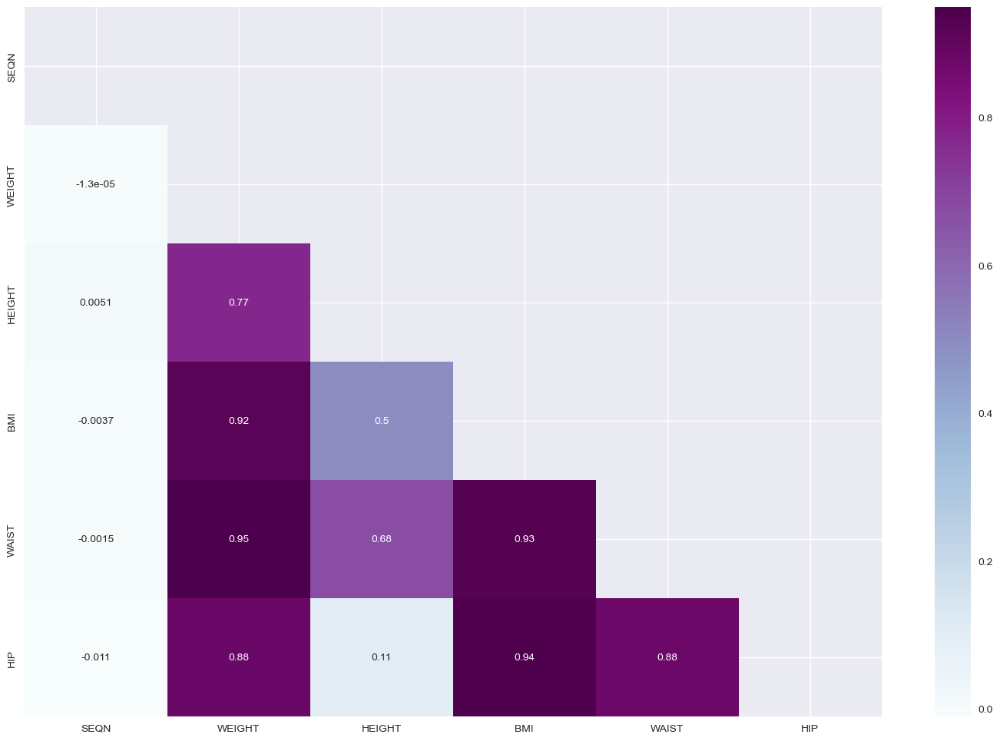

In [152]:
plt.figure(figsize=(18,12))
mask = np.triu(np.ones_like(df_corr))
sns.heatmap(df_corr, mask=mask,annot=True, cmap='BuPu')

<p style="color:#20568B; font-size:16px";>
We can see a very high positive correlation between the weight of a person and hip size of a person. Therefore in terms of data ingestion for the missing values, we can use the weight measures to estimate the places where the weight values are missing. We can then calculate the BMI using the weight and the height values. Since the height values do not correlate with anything, we will look at elimminating those rows.</p>

In [153]:
df_body2[['HEIGHT', 'BMI']].corr() # Checking correlation between weight and waist measurements.

,HEIGHT,BMI
HEIGHT,1.000000,0.497334
BMI,0.497334,1.000000


In [154]:
weight_na = df_body2.WEIGHT.isna()
df_body2.loc[weight_na, :]

,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
6046,116480.0,NaN,185.8,NaN,109.8,105.0
7887,118663.0,NaN,166.0,NaN,70.5,89.6
9337,120366.0,NaN,184.2,NaN,90.3,101.8
9586,120666.0,NaN,173.6,NaN,90.9,99.8
11766,123219.0,NaN,165.1,NaN,79.9,92.3


<p style="color:#20568B; font-size:16px";>
We will now group the waist measurements, by taking a mid-point on a five point scale, + 2cms and - 2 cms to define the range groups and then calculate the means for that range.</p>

In [155]:
# For each of the missing weight values.
for x in (df_body2.loc[weight_na, :].index):
    upper_waist = df_body2.WAIST.iloc[x] + 2 # Upper bound.
    lower_waist = df_body2.WAIST.iloc[x] - 2 # Lower bound.
    waist_range = df_body2[(df_body2.WAIST >= lower_waist) & (df_body2.WAIST <= upper_waist)]
    
    # Confirming the range sample is large enough to extrapolate a realistic mean. 
    print(f'Count of waist measures in the range {lower_waist}-{upper_waist}cm:\t'
          f'{len(waist_range)}, The Mean weight of the range is: {waist_range.WEIGHT.mean()}')
    
    df_body2.WEIGHT.iloc[x] = waist_range.WEIGHT.mean() # Input estimated body weight.
    df_body2.BMI.iloc[x] = (waist_range.WEIGHT.mean())/((df_body2.HEIGHT.iloc[x]/100)**2) # Calc BMI.
    
df_body2[['WEIGHT', 'BMI']] = df_body2[['WEIGHT', 'BMI']].round(2) # Rounding values.

Count of waist measures in the range 107.8-111.8cm:	654, The Mean weight of the range is: 92.61163859111791
Count of waist measures in the range 68.5-72.5cm:	559, The Mean weight of the range is: 49.78351254480287
Count of waist measures in the range 88.3-92.3cm:	878, The Mean weight of the range is: 70.92762557077626
Count of waist measures in the range 88.9-92.9cm:	893, The Mean weight of the range is: 71.43422379548294
Count of waist measures in the range 77.9-81.9cm:	692, The Mean weight of the range is: 60.71403762662808


In [156]:
df_body2.loc[weight_na, :]

,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
6046,116480.0,92.61,185.8,26.83,109.8,105.0
7887,118663.0,49.78,166.0,18.07,70.5,89.6
9337,120366.0,70.93,184.2,20.90,90.3,101.8
9586,120666.0,71.43,173.6,23.70,90.9,99.8
11766,123219.0,60.71,165.1,22.27,79.9,92.3


<p style="color:#20568B; font-size:16px";>
Dropping the rows that have Null Values in the Height and BMI columns</p>

In [157]:
df_body2.dropna(subset=['HEIGHT'], axis=0, inplace=True) # Dropping rows.
df_body2.reset_index(drop=True, inplace=True) # Resetting the index. 

In [158]:
print(df_body2.shape)
df_body2.isna().apply([np.sum])

(13142, 6)


,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
sum,0,0,0,0,603,3296


<p style="color:#20568B; font-size:16px";>
We can see below that there are 603 records that have waist as NaN. We will now use the values in the weight column that we eliminated the missing values from to add the missing waist values</p>

In [159]:
waist_na = df_body2.WAIST.isna()
print(len(df_body2.loc[waist_na, :]))
df_body2.loc[waist_na, :].head()

603


,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
7,109275.0,20.9,120.4,14.4,NaN,NaN
11,109280.0,12.4,87.6,16.2,NaN,NaN
12,109282.0,83.3,177.1,26.6,NaN,NaN
15,109286.0,72.6,158.4,28.9,NaN,106.5
17,109288.0,22.7,111.4,18.3,NaN,NaN


<p style="color:#20568B; font-size:16px";>
We can see from the below code, the waist measurements for people who fall into the sample of less than 100 bucket are excluded. This is in order to calculate a realistic mean measurement. The sample comprises of all participants that are 2kg lighter or heavier than the target subject.</p>

In [161]:
count = 0 # to capture the number of records ignored. 
# To calculate the average number of people included when estimating the waist measure via the mean. 
avg_count = [] 

# For each of the missing waist values.
for x in (df_body2.loc[waist_na, :].index):
    upper_weight = df_body2.WEIGHT.iloc[x] + 2 # Upper bound.
    lower_weight = df_body2.WEIGHT.iloc[x] - 2 # Lower bound.
    weight_range = df_body2[(df_body2.WEIGHT >= lower_weight) & (df_body2.WEIGHT <= upper_weight)]
    
    # Checking the range sample. This is pegged to be large enough to extrapolate a realistic mean, i.e. > 100. 
    if len(weight_range) < 100:
        count += 1
    else:
        df_body2.WAIST.iloc[x] = weight_range.WEIGHT.mean() # Input estimated waist Measurment.(in the form of mean)
        avg_count.append(len(weight_range))
    
    
df_body2['WAIST'] = df_body2['WAIST'].round(2) # Rounding values.
print(f'The count of people skipped due to the sample size being small: {count}')
print(f'Average number of people when calculating each mean: {np.mean(avg_count):.2f}')

The count of people skipped due to the sample size being small: 37
Average number of people when calculating each mean: 534.46


In [163]:
df_body2.loc[waist_na, :].head()

,SEQN,WEIGHT,HEIGHT,BMI,WAIST,HIP
7,109275.0,20.9,120.4,14.4,20.86,NaN
11,109280.0,12.4,87.6,16.2,12.91,NaN
12,109282.0,83.3,177.1,26.6,83.33,NaN
15,109286.0,72.6,158.4,28.9,72.57,106.5
17,109288.0,22.7,111.4,18.3,22.57,NaN


<p style="color:#20568B; font-size:16px";>
We will drop the hip measurement column to proceed further with the analysis. Hip is not going to add additional information or value for now.</p>

In [164]:
df_body2.drop('HIP', axis=1, inplace=True) # Decided to discar the hip measurement, not of interest here. 
print(df_body2.shape)
df_body2.isna().apply([np.sum])

(13142, 5)


,SEQN,WEIGHT,HEIGHT,BMI,WAIST
sum,0,0,0,0,37


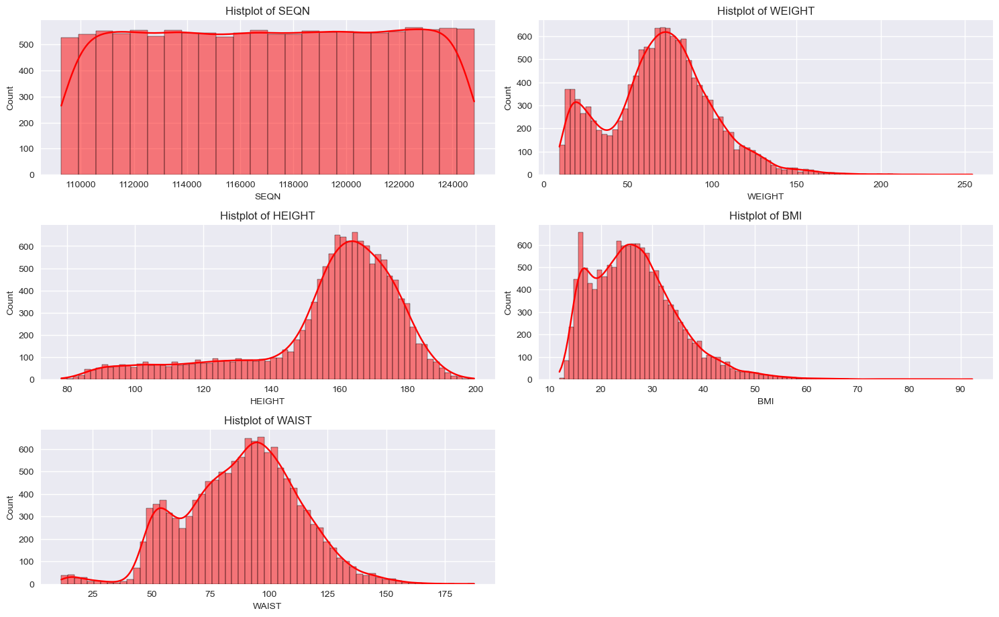

In [166]:
plt.figure(figsize = (15,15))
feature_list = df_body2.columns
for i in range(len(feature_list)):
    plt.subplot(5, 2, i + 1)
    sns.histplot(x = df_body2[feature_list[i]], data = df_body2,color="red",kde=True)
    plt.title('Histplot of {}'.format(feature_list[i]))
    plt.tight_layout()

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 4: Let us take Data Set 4 - Diet Behaviour Data</h2>

In [194]:
df_diet = pd.read_sas('P_DBQ.xpt')
print(df_diet.shape) # Checking if the full dataset was imported. 
df_diet.head()

(15560, 46)


,SEQN,DBQ010,DBD030,DBD041,DBD050,DBD055,DBD061,DBQ073A,DBQ073B,DBQ073C,...,DBD900,DBD905,DBD910,CBQ596,CBQ606,CBQ611,DBQ930,DBQ935,DBQ940,DBQ945
0,109263.0,1.0,5.397605e-79,365.0,730.0,182.0,365.0,10.0,NaN,NaN,...,5.397605e-79,5.397605e-79,5.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,109264.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.397605e-79,1.000000e+00,1.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,109265.0,9.0,NaN,999999.0,730.0,999999.0,NaN,NaN,NaN,NaN,...,2.000000e+00,5.397605e-79,2.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,109266.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,5.000000e+00,1.0,2.0,2.0,1.0,1.0,1.0,2.0
4,109267.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.397605e-79,5.397605e-79,5.397605e-79,2.0,NaN,NaN,1.0,2.0,1.0,2.0


### Column Descriptions and their Values - To Assess and Choose only the required Columns

* **SEQN - Respondent sequence number**
* DBQ010 - Ever breastfed or fed breastmilk
* DBD030 - Age stopped breastfeeding(days)
* DBD041 - Age first fed formula(days)
* DBD050 - Age stopped receiving formula(days)
* DBD055 - Age started other food/beverage
* DBD061 - Age first fed milk(days)
* DBQ073A - Type of milk first fed - whole milk
* DBQ073B - Type of milk first fed - 2% milk
* DBQ073C - Type of milk first fed - 1% milk
* DBQ073D - Type of milk first fed - fat free milk
* DBQ073E - Type of milk first fed - soy milk
* DBQ073U - Type of milk first fed - other
* DBD085 - CHECK ITEM
* **DBQ700 - How healthy is the diet**
    1: Excellent
    2: Very Good
    3: Good
    4: Fair
    5: Poor
    7: Refused (2), 
    9: Don't know (3), 
    . Missing (5,365)
* **DBQ197 - Past 30 day milk product consumption**
    0: Never
    1: Rarely (< once p/week)
    2: Sometimes (>= once p/week)
    3: Often (>= once p/day)
    4: Varied
    9: Don't know (1), 
    . Missing (574)
* **DBQ223A - You drink whole or regular milk**
    0:	Whole or regular
    77:	Refused	(0)
    99:	Don't know (30)
    .	Missing	(10621)
* **DBQ223B - You drink 2% fat milk**
    11:	2% fat or reduced-fat milk	(4740)
    .	Missing	(10820)
* **DBQ223C - You drink 1% fat milk**
    12:	1% fat or low-fat milk (includes 0.5% fat milk or "low-fat milk" not further specified)	(1475)
    .	Missing	14085	15560
* **DBQ223D - You drink fat free/skim milk**
    13:	Fat-free, skim or nonfat milk (613)
    .	Missing	(14947)
* **DBQ223E - You drink soy milk**
    14:	Soy milk (293)
    .	Missing	(15267)
    
* **DBQ223U - You drink another type of milk**
    30:	Another type	(1228)		
    .	Missing	(14332)	

* DBD225 - CHECK ITEM
* **DBQ229 - Regular milk use 5 times per week**
    1: Regular - Most or all of life
    2: Never been a regular milk drinker
    3: Varied - Sometime regular, sometimes not.
    7: Refused (1),
    9: Don't know (5), 
    . Missing (6,328)
* DBQ235A - How often drank milk age 5-12
* DBQ235B - How often drank milk age 13-17

In [195]:
df_diet2 = df_diet[['SEQN', 'DBQ700', 'DBQ197', 'DBQ223A', 'DBQ223B', 'DBQ223C', 'DBQ223D', 'DBQ223E', 'DBQ223U', 'DBQ229']].copy()
column_names = ['SEQN', 'DIET', 'MILK_CONS', 'MILK_REG', 'MILK_2%', 'MILK_1%', 'MILK_SKIM', 'MILK_SOY', 'MILK_OTHER', 'MILK_USE']
df_diet2.columns = column_names
df_diet2.head()

,SEQN,DIET,MILK_CONS,MILK_REG,MILK_2%,MILK_1%,MILK_SKIM,MILK_SOY,MILK_OTHER,MILK_USE
0,109263.0,NaN,3.000000e+00,NaN,NaN,NaN,NaN,NaN,30.0,NaN
1,109264.0,NaN,3.000000e+00,NaN,NaN,12.0,NaN,NaN,NaN,NaN
2,109265.0,NaN,3.000000e+00,NaN,NaN,12.0,NaN,NaN,NaN,NaN
3,109266.0,3.0,2.000000e+00,NaN,NaN,NaN,NaN,NaN,30.0,3.0
4,109267.0,1.0,5.397605e-79,NaN,NaN,NaN,NaN,NaN,NaN,2.0


In [196]:
print(df_diet2.dtypes)

SEQN          float64
DIET          float64
MILK_CONS     float64
MILK_REG      float64
MILK_2%       float64
MILK_1%       float64
MILK_SKIM     float64
MILK_SOY      float64
MILK_OTHER    float64
MILK_USE      float64
dtype: object


In [197]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_diet2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_diet2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,DIET,5365,34.48
2,MILK_CONS,574,3.69
3,MILK_REG,10621,68.26
4,MILK_2%,10820,69.54
5,MILK_1%,14085,90.52
6,MILK_SKIM,14947,96.06
7,MILK_SOY,15267,98.12
8,MILK_OTHER,14332,92.11
9,MILK_USE,6328,40.67


In [198]:
# Updateing DIET values
df_diet2.SEQN = df_diet2.SEQN.astype(int)
df_diet2.loc[df_diet2.DIET == 1, 'DIET'] = 'Excellant'
df_diet2.loc[df_diet2.DIET == 2, 'DIET'] = 'Very Good'
df_diet2.loc[df_diet2.DIET == 3, 'DIET'] = 'Good'
df_diet2.loc[df_diet2.DIET == 4, 'DIET'] = 'Fair'
df_diet2.loc[df_diet2.DIET == 5, 'DIET'] = 'Poor'
df_diet2.loc[df_diet2.DIET == 7, 'DIET'] = 'Unknown'
df_diet2.loc[df_diet2.DIET == 9, 'DIET'] = 'Unknown'
df_diet2.loc[df_diet2.DIET.isna(), 'DIET'] = 'Unknown'

# Updateing MILK CONSUMPTION values
zero = 5.397605346934028e-79
df_diet2.loc[df_diet2.MILK_CONS == zero, 'MILK_CONS'] = 'Never'
df_diet2.loc[df_diet2.MILK_CONS == 1, 'MILK_CONS'] = '<= Once per week'
df_diet2.loc[df_diet2.MILK_CONS == 2, 'MILK_CONS'] = '>= Once per week'
df_diet2.loc[df_diet2.MILK_CONS == 3, 'MILK_CONS'] = '>= Once per day'
df_diet2.loc[df_diet2.MILK_CONS == 4, 'MILK_CONS'] = 'Varied'
df_diet2.loc[df_diet2.MILK_CONS == 9, 'MILK_CONS'] = 'Unknown'
df_diet2.loc[df_diet2.MILK_CONS.isna(), 'MILK_CONS'] = 'Unknown'

# Updateing MILK_USE Values 
df_diet2.loc[df_diet2.MILK_USE == 1, 'MILK_USE'] = '5 Times per week'
df_diet2.loc[df_diet2.MILK_USE == 2, 'MILK_USE'] = '0 Times per week'
df_diet2.loc[df_diet2.MILK_USE == 3, 'MILK_USE'] = '1-5 Times per week'
df_diet2.loc[df_diet2.MILK_USE == 7, 'MILK_USE'] = 'Unknown'
df_diet2.loc[df_diet2.MILK_USE == 9, 'MILK_USE'] = 'Unknown'
df_diet2.loc[df_diet2.MILK_USE.isna(), 'MILK_USE'] = 'Unknown'

# Updateing MILK Types
df_diet2.loc[df_diet2.MILK_REG == 10, 'MILK_REG'] = 'Regular'
df_diet2.loc[df_diet2.MILK_REG == 99, 'MILK_REG'] = np.nan # Don't require participants that don't know. 
df_diet2.loc[df_diet2['MILK_2%'] == 11, 'MILK_2%'] = '2% Fat'
df_diet2.loc[df_diet2['MILK_1%'] == 12, 'MILK_1%'] = '1% Fat'
df_diet2.loc[df_diet2.MILK_SKIM == 13, 'MILK_SKIM'] = 'Skim'
df_diet2.loc[df_diet2.MILK_SOY == 14, 'MILK_SOY'] = 'Soy'
df_diet2.loc[df_diet2.MILK_OTHER == 30, 'MILK_OTHER'] = 'Other'

df_diet2.head()

,SEQN,DIET,MILK_CONS,MILK_REG,MILK_2%,MILK_1%,MILK_SKIM,MILK_SOY,MILK_OTHER,MILK_USE
0,109263,Unknown,>= Once per day,NaN,NaN,NaN,NaN,NaN,Other,Unknown
1,109264,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown
2,109265,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown
3,109266,Good,>= Once per week,NaN,NaN,NaN,NaN,NaN,Other,1-5 Times per week
4,109267,Excellant,Never,NaN,NaN,NaN,NaN,NaN,NaN,0 Times per week


In [199]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_diet2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_diet2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,DIET,0,0.00
2,MILK_CONS,0,0.00
3,MILK_REG,10651,68.45
4,MILK_2%,10820,69.54
5,MILK_1%,14085,90.52
6,MILK_SKIM,14947,96.06
7,MILK_SOY,15267,98.12
8,MILK_OTHER,14332,92.11
9,MILK_USE,0,0.00


<p style="color:#20568B; font-size:16px";>
Majority of the rows in this dataset has 1 entry for the type of milk consumed. That is either it is Regular, 2% Milk, 1% Milk, Skimmed Milk, Soy Milk or Other Milk. There are few rows where there is more than 1 entry saying that they consume more than one type. Analyzing there are around 600 rows with more than 1 milk type consumed. We will now drop any row that does not have even a single value across the type of milk they consume. That is all the rows that have NaN.</p>

In [200]:
df_diet2.dropna(axis=0, thresh=5, inplace=True)
df_diet2 = df_diet2.reset_index(drop=True)
print(df_diet2.shape)

df_diet2.head()

(12596, 10)


,SEQN,DIET,MILK_CONS,MILK_REG,MILK_2%,MILK_1%,MILK_SKIM,MILK_SOY,MILK_OTHER,MILK_USE
0,109263,Unknown,>= Once per day,NaN,NaN,NaN,NaN,NaN,Other,Unknown
1,109264,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown
2,109265,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown
3,109266,Good,>= Once per week,NaN,NaN,NaN,NaN,NaN,Other,1-5 Times per week
4,109268,Good,>= Once per day,NaN,2% Fat,NaN,NaN,NaN,NaN,Unknown


<p style="color:#20568B; font-size:16px";>
The milk types are in Columns. We will look to transform the dataframe and transpose all the different milk types to a single column. There are 6 milk types 
* Regular Milk
* 2 % Milk
* 1 % Milk
* Skimmed Milk
* Soy Milk
* Other Milk</p>

In [201]:
merge_milk_type = []

for x in range(len(df_diet2)):
    value = ''
    if df_diet2.MILK_REG[x] == 'Regular':
        if value == '':
            value = 'Dairy Regular' 
        elif value != np.nan:
            if ('Dairy' not in value):
                value = 'Mixed' 
            
    if df_diet2['MILK_2%'][x] == '2% Fat':
        if value == '':
            value = 'Dairy 2%' 
        elif value != np.nan:
            if ('Dairy' not in value):
                value = 'Mixed' 
            
    if df_diet2['MILK_1%'][x] == '1% Fat':
        if value == '':
            value = 'Dairy 1%'
        elif value != np.nan:
            if ('Dairy' not in value):
                value = 'Mixed' 
        
    if df_diet2.MILK_SKIM[x] == 'Skim':
        if value == '':
            value = 'Dairy Skim' 
        elif value != np.nan:
            if ('Dairy' not in value):
                value = 'Mixed' 
        
    if df_diet2.MILK_SOY[x] == 'Soy':
        if value == '':
            value = 'Soy' 
        elif value != np.nan:
            if ('Non' not in value):
                value = 'Mixed' 
        
    if df_diet2.MILK_OTHER[x] == 'Other':
        if value == '':
            value = 'Other'
        elif value != np.nan:
            if ('Non' not in str(value)):
                value = 'Mixed'
    
    merge_milk_type.append(value)

In [202]:
len(merge_milk_type)

12596

In [204]:
df_diet2['MILK_TYPE'] = merge_milk_type

In [205]:
df_diet2.head()

,SEQN,DIET,MILK_CONS,MILK_REG,MILK_2%,MILK_1%,MILK_SKIM,MILK_SOY,MILK_OTHER,MILK_USE,MILK_TYPE
0,109263,Unknown,>= Once per day,NaN,NaN,NaN,NaN,NaN,Other,Unknown,Other
1,109264,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown,Dairy 1%
2,109265,Unknown,>= Once per day,NaN,NaN,1% Fat,NaN,NaN,NaN,Unknown,Dairy 1%
3,109266,Good,>= Once per week,NaN,NaN,NaN,NaN,NaN,Other,1-5 Times per week,Other
4,109268,Good,>= Once per day,NaN,2% Fat,NaN,NaN,NaN,NaN,Unknown,Dairy 2%


In [209]:
print(len(df_diet2))
df_diet2.MILK_TYPE.value_counts()

12596


Dairy Regular    4826
Dairy 2%         4416
Dairy 1%         1323
Other             988
Dairy Skim        546
Mixed             281
Soy               216
Name: MILK_TYPE, dtype: int64

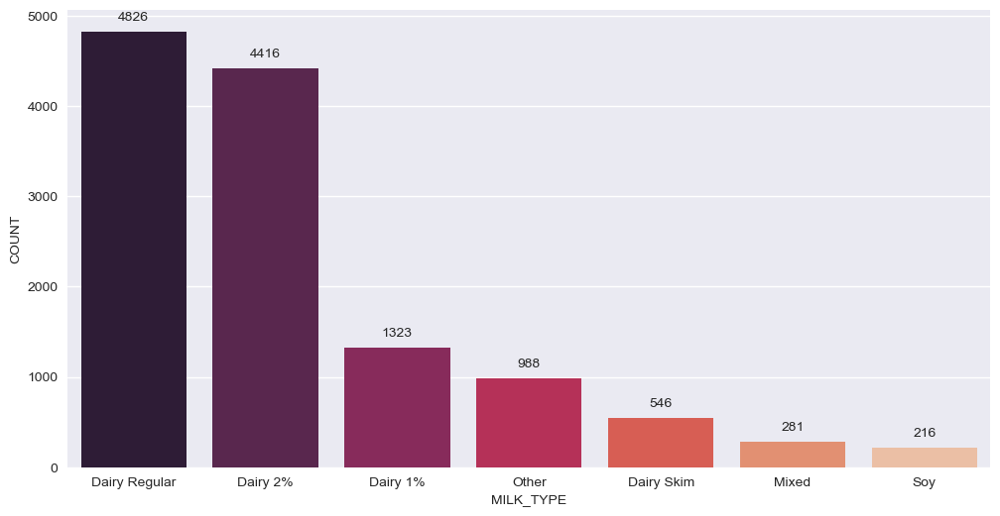

In [210]:
#Visual Representation of Categorical Variables in the dataset
#Milk Type
plot1 = pd.DataFrame(df_diet2['MILK_TYPE'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_TYPE","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_TYPE',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

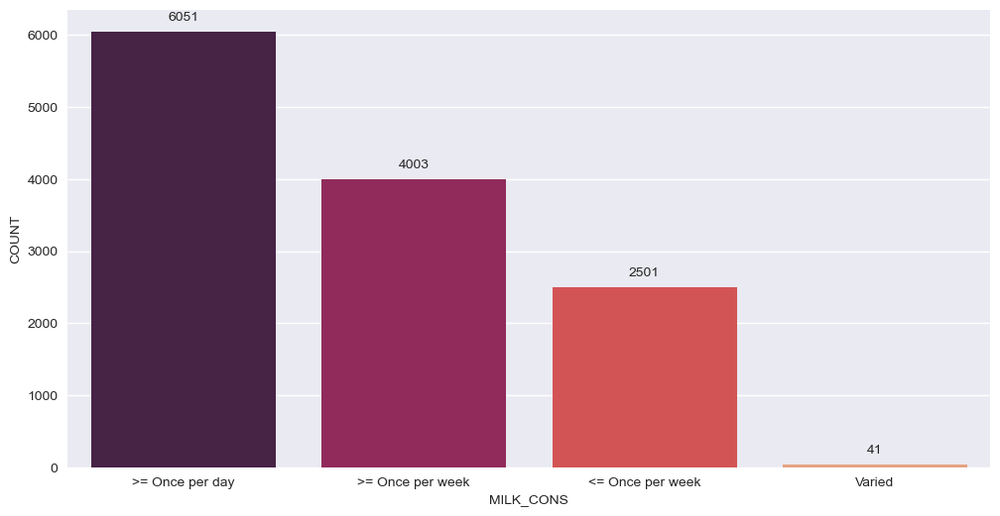

In [211]:
#Visual Representation of Categorical Variables in the dataset
#Milk Consumption
plot1 = pd.DataFrame(df_diet2['MILK_CONS'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_CONS","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_CONS',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

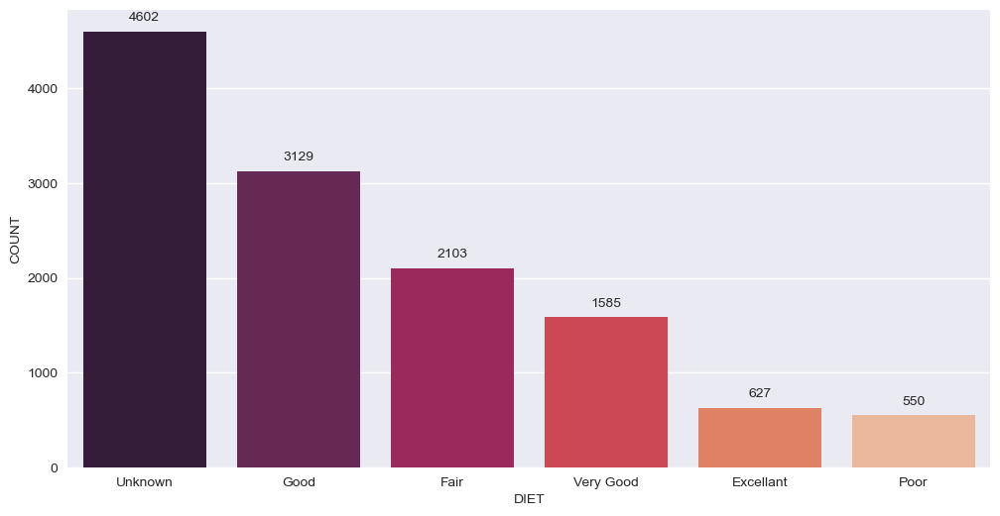

In [212]:
#Visual Representation of Categorical Variables in the dataset
#DIET
plot1 = pd.DataFrame(df_diet2['DIET'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["DIET","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='DIET',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

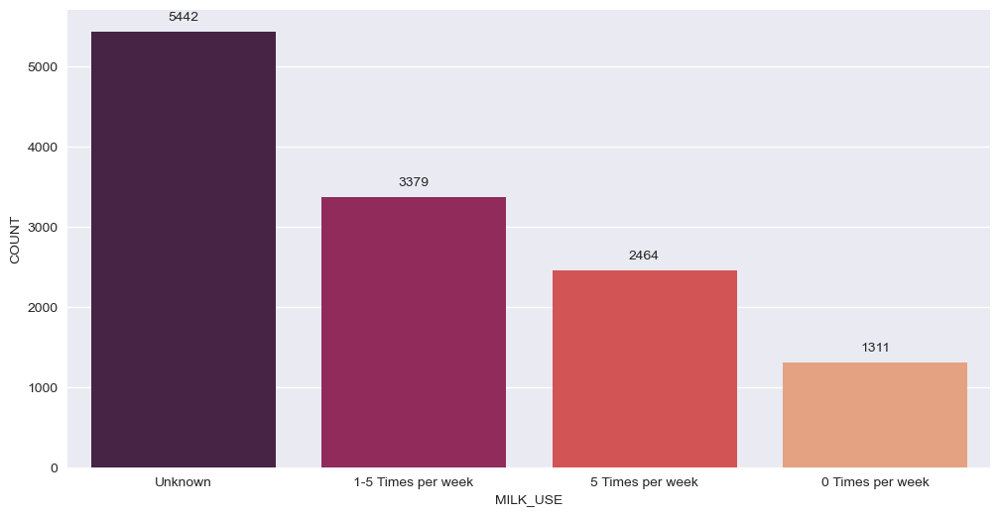

In [213]:
#Visual Representation of Categorical Variables in the dataset
#MILK USE
plot1 = pd.DataFrame(df_diet2['MILK_USE'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_USE","COUNT"]
fig_dims = (12, 6)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_USE',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 5: Let us take Data Set 5 - Blood Pressure Data</h2>

In [214]:
df_blood = pd.read_sas('P_BPXO.xpt')
print(df_blood.shape) # Checking if the full dataset was imported. 
df_blood.head()

(11656, 12)


,SEQN,BPAOARM,BPAOCSZ,BPXOSY1,BPXODI1,BPXOSY2,BPXODI2,BPXOSY3,BPXODI3,BPXOPLS1,BPXOPLS2,BPXOPLS3
0,109264.0,b'R',3.0,109.0,67.0,109.0,68.0,106.0,66.0,94.0,95.0,91.0
1,109266.0,b'R',4.0,99.0,56.0,99.0,55.0,99.0,52.0,68.0,66.0,66.0
2,109270.0,b'R',3.0,123.0,73.0,124.0,77.0,127.0,70.0,95.0,98.0,93.0
3,109271.0,b'R',4.0,102.0,65.0,108.0,68.0,111.0,68.0,73.0,71.0,70.0
4,109273.0,b'R',3.0,116.0,68.0,110.0,66.0,115.0,68.0,71.0,70.0,70.0


### Column Descriptions and their Values - To Assess and Choose only the required Columns

* **SEQN - Respondent sequence number**
* BPAOARM - Arm selected - oscillometric
* BPAOCSZ - Coded cuff size - oscillometric
* **BPXOSY1 - Systolic - 1st oscillometric reading**
* **BPXODI1 - Diastolic - 1st oscillometric reading**
* **BPXOSY2 - Systolic - 2nd oscillometric reading**
* **BPXODI2 - Diastolic - 2nd oscillometric reading**
* **BPXOSY3 - Systolic - 3rd oscillometric reading**
* **BPXODI3 - Diastolic - 3rd oscillometric reading**
* BPXOPLS1 - Pulse - 1st oscillometric reading
* BPXOPLS2 - Pulse - 2nd oscillometric reading
* BPXOPLS3 - Pulse - 3rd oscillometric reading

Understanding Blood Preasure Readings - [heart.org](https://www.heart.org/en/health-topics/high-blood-pressure/understanding-blood-pressure-readings)

BLOOD PRESSURE CATEGORY | SYSTOLIC mm Hg (upper number)	| and/or | DIASTOLIC mm Hg (lower number)
------------------------|-------------------------------|--------|--------------------------------
NORMAL | LESS THAN 120 | and | LESS THAN 80
ELEVATED | 120 – 129 | and | LESS THAN 80
HIGH BLOOD PRESSURE (HYPERTENSION) STAGE 1 | 130 – 139 | or | 80 – 89
HIGH BLOOD PRESSURE (HYPERTENSION) STAGE 2 | 140 OR HIGHER | or | 90 OR HIGHER
HYPERTENSIVE CRISIS (consult your doctor immediately) | HIGHER THAN 180 | and/or | HIGHER THAN 120

**Systolic pressure** (the top number) is the pressure of the blood in your arteries when your heart contracts or beats.

**Diastolic pressure** (the bottom number) is the pressure of the blood in your arteries between beats, when your heart relaxes.

In [215]:
df_blood2 = df_blood.drop(['BPAOARM', 'BPAOCSZ', 'BPXOPLS1', 'BPXOPLS2', 'BPXOPLS3'], axis=1)

column_names = ['SEQN',  'SYS_1', 'DIA_1', 'SYS_2', 'DIA_2', 'SYS_3', 'DIA_3']

df_blood2.columns = column_names

df_blood2.head()

,SEQN,SYS_1,DIA_1,SYS_2,DIA_2,SYS_3,DIA_3
0,109264.0,109.0,67.0,109.0,68.0,106.0,66.0
1,109266.0,99.0,56.0,99.0,55.0,99.0,52.0
2,109270.0,123.0,73.0,124.0,77.0,127.0,70.0
3,109271.0,102.0,65.0,108.0,68.0,111.0,68.0
4,109273.0,116.0,68.0,110.0,66.0,115.0,68.0


In [216]:
is_duplicate = df_blood2.duplicated() #Checking to see if there are any duplicate rows in the dataset
print('Number of duplicate rows = %d' % (is_duplicate.sum()))

Number of duplicate rows = 0


In [217]:
#The number of rows and columns in the demographic dataset
print('The number of rows (observations) is',df_blood2.shape[0],'\n''The number of columns (variables) is',df_blood2.shape[1])

The number of rows (observations) is 11656 
The number of columns (variables) is 7


<p style="color:#20568B; font-size:16px";>
We can take the mean of all the 3 observations of the Sys and Dia and convert them into just 2 columns</p>

In [218]:
df_blood2.SEQN = df_blood2.SEQN.astype(int)

#Taking the average of  sys of all the 3 measurements
df_blood2['SYS_MEAN'] = df_blood2[['SYS_1', 'SYS_2', 'SYS_3']].mean(axis=1)
#Taking the average of dia of all the 3 measurements
df_blood2['DIA_MEAN'] = df_blood2[['DIA_1', 'DIA_2', 'DIA_3']].mean(axis=1)

df_blood2.SYS_MEAN = df_blood2.SYS_MEAN.round(2)
df_blood2.DIA_MEAN = df_blood2.DIA_MEAN.round(2)

df_blood2.drop(['SYS_1', 'SYS_2', 'SYS_3', 'DIA_1', 'DIA_2', 'DIA_3'], axis=1, inplace=True)

df_blood2.head()

,SEQN,SYS_MEAN,DIA_MEAN
0,109264,108.00,67.00
1,109266,99.00,54.33
2,109270,124.67,73.33
3,109271,107.00,67.00
4,109273,113.67,67.33


In [219]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_blood2.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_blood2.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,SYS_MEAN,1303,11.18
2,DIA_MEAN,1303,11.18


In [220]:
#Dropping the NaN values
df_blood2 = df_blood2.dropna()
print(df_blood2.shape)
df_blood2.isna().apply([np.sum])

(10353, 3)


,SEQN,SYS_MEAN,DIA_MEAN
sum,0,0,0


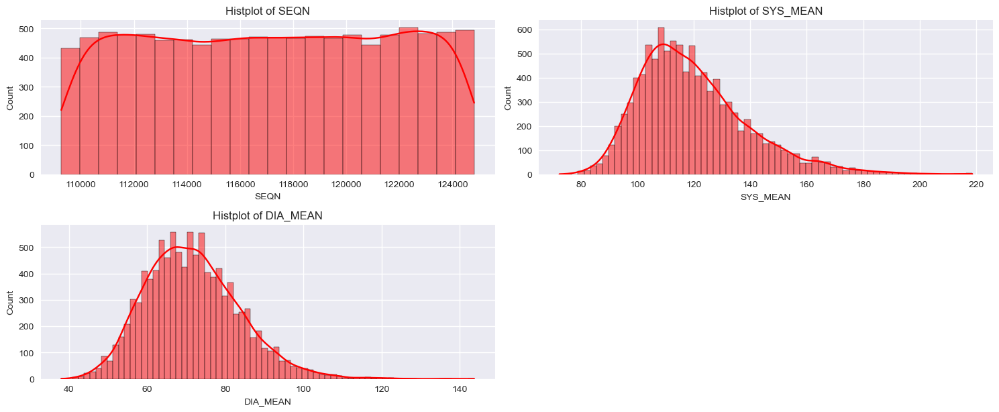

In [222]:
plt.figure(figsize = (15,15))
feature_list = df_blood2.columns
for i in range(len(feature_list)):
    plt.subplot(5, 2, i + 1)
    sns.histplot(x = df_blood2[feature_list[i]], data = df_blood2,color="red",kde=True)
    plt.title('Histplot of {}'.format(feature_list[i]))
    plt.tight_layout()

<h style="height:1px; width:100%">

<h2 style="color:#1D3361"> Step 6: Joining Data Frames to Perform Combined Analysis</h2>

### We will join the demographic data dataframe and the diet data dataframe


In [228]:
df_demographic_2.rename(columns = {'SEQN_NO':'SEQN'}, inplace = True) 

In [229]:
#Performing a merge on the Sequence Number and doing and inner join between the two dataframes
df_demo_diet = pd.merge(df_diet2, df_demographic_2, on='SEQN', how='inner')
#Dropping all the columns, which is milk types that have been combined into one column.
df_demo_diet.drop(['MILK_REG', 'MILK_2%', 'MILK_1%', 'MILK_SKIM', 'MILK_SOY', 'MILK_OTHER'], axis=1, inplace=True)

In [230]:
print(df_demo_diet.shape)
df_demo_diet.head()

(12596, 11)


,SEQN,DIET,MILK_CONS,MILK_USE,MILK_TYPE,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO
0,109263,Unknown,>= Once per day,Unknown,Other,Male,2.0,USA,Unknown,Unknown,4.66
1,109264,Unknown,>= Once per day,Unknown,Dairy 1%,Female,13.0,USA,Unknown,Unknown,0.83
2,109265,Unknown,>= Once per day,Unknown,Dairy 1%,Male,2.0,USA,Unknown,Unknown,3.06
3,109266,Good,>= Once per week,1-5 Times per week,Other,Female,29.0,Others,College Grad and above,Never Married,5.00
4,109268,Good,>= Once per day,Unknown,Dairy 2%,Female,18.0,USA,Unknown,Unknown,1.66


### We will join the body measurements data dataframe and the demographic and diet data combined dataframe


In [231]:
df_demo_diet_body = pd.merge(df_demo_diet, df_body2, on='SEQN', how='inner')

print(df_demo_diet_body.shape)
df_demo_diet_body.head()

(11005, 15)


,SEQN,DIET,MILK_CONS,MILK_USE,MILK_TYPE,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO,WEIGHT,HEIGHT,BMI,WAIST
0,109264,Unknown,>= Once per day,Unknown,Dairy 1%,Female,13.0,USA,Unknown,Unknown,0.83,42.2,154.7,17.6,63.8
1,109265,Unknown,>= Once per day,Unknown,Dairy 1%,Male,2.0,USA,Unknown,Unknown,3.06,12.0,89.3,15.0,41.2
2,109266,Good,>= Once per week,1-5 Times per week,Other,Female,29.0,Others,College Grad and above,Never Married,5.00,97.1,160.2,37.8,117.9
3,109270,Unknown,>= Once per day,Unknown,Dairy 2%,Female,11.0,USA,Unknown,Unknown,1.88,75.3,156.0,30.9,91.4
4,109271,Good,<= Once per week,0 Times per week,Dairy Regular,Male,49.0,USA,12th Grade,Never Married,NaN,98.8,182.3,29.7,120.4


### We will join the cholestrol data dataframe and the combined dataframe of demographic, body measurements and diet


In [233]:
df_demo_diet_body_chol = pd.merge(df_demo_diet_body, df_chol2, on='SEQN', how='inner')

print(df_demo_diet_body_chol.shape)
df_demo_diet_body_chol.head()

(8743, 16)


,SEQN,DIET,MILK_CONS,MILK_USE,MILK_TYPE,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO,WEIGHT,HEIGHT,BMI,WAIST,CHOL_mg
0,109264,Unknown,>= Once per day,Unknown,Dairy 1%,Female,13.0,USA,Unknown,Unknown,0.83,42.2,154.7,17.6,63.8,166.0
1,109266,Good,>= Once per week,1-5 Times per week,Other,Female,29.0,Others,College Grad and above,Never Married,5.00,97.1,160.2,37.8,117.9,195.0
2,109270,Unknown,>= Once per day,Unknown,Dairy 2%,Female,11.0,USA,Unknown,Unknown,1.88,75.3,156.0,30.9,91.4,103.0
3,109271,Good,<= Once per week,0 Times per week,Dairy Regular,Male,49.0,USA,12th Grade,Never Married,NaN,98.8,182.3,29.7,120.4,147.0
4,109273,Fair,<= Once per week,0 Times per week,Mixed,Male,36.0,USA,AA Degree,Never Married,0.83,74.3,184.2,21.9,86.8,164.0


### We will join the blood pressure data dataframe and the combined dataframe of demographic, body measurements, diet and cholestrol


In [234]:
df_consolidated = pd.merge(df_demo_diet_body_chol, df_blood2, on='SEQN', how='inner')

print(df_consolidated.shape)
df_consolidated.head()

(7585, 18)


,SEQN,DIET,MILK_CONS,MILK_USE,MILK_TYPE,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO,WEIGHT,HEIGHT,BMI,WAIST,CHOL_mg,SYS_MEAN,DIA_MEAN
0,109264,Unknown,>= Once per day,Unknown,Dairy 1%,Female,13.0,USA,Unknown,Unknown,0.83,42.2,154.7,17.6,63.8,166.0,108.00,67.00
1,109266,Good,>= Once per week,1-5 Times per week,Other,Female,29.0,Others,College Grad and above,Never Married,5.00,97.1,160.2,37.8,117.9,195.0,99.00,54.33
2,109270,Unknown,>= Once per day,Unknown,Dairy 2%,Female,11.0,USA,Unknown,Unknown,1.88,75.3,156.0,30.9,91.4,103.0,124.67,73.33
3,109271,Good,<= Once per week,0 Times per week,Dairy Regular,Male,49.0,USA,12th Grade,Never Married,NaN,98.8,182.3,29.7,120.4,147.0,107.00,67.00
4,109273,Fair,<= Once per week,0 Times per week,Mixed,Male,36.0,USA,AA Degree,Never Married,0.83,74.3,184.2,21.9,86.8,164.0,113.67,67.33


In [235]:
#Missing Value Analysis
missing_values=pd.DataFrame(df_consolidated.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / df_consolidated.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,SEQN,0,0.00
1,DIET,0,0.00
2,MILK_CONS,0,0.00
3,MILK_USE,0,0.00
4,MILK_TYPE,0,0.00
5,GENDER,0,0.00
6,AGE_YR,0,0.00
7,BIRTH_COUNTRY,0,0.00
8,EDU_LVL,0,0.00
9,MAR_STAT,0,0.00


In [236]:
print('The number of rows (observations) is',df_consolidated.shape[0],'\n''The number of columns (variables) is',df_consolidated.shape[1])

The number of rows (observations) is 7585 
The number of columns (variables) is 18


<p style="color:#20568B; font-size:16px";>
From the original data set, we have removed approximately 4000 to 5000 records. We still have adequate data to continue to perform analysis and generate insights.
</p>

<p style="color:#20568B; font-size:16px";>
We know that from our previous steps, there are obvious correlations between BMI, Height and Weight. Therefore we will leave out height, weight and waist and further our analyis to see if there is some other correlations and insights.
</p>

<p style="color:#20568B; font-size:16px";>
To do this we will create a new standardised matrix of our metrics of interest, AGE_YR, BMI, CHOL_mg, SYS_MEAN, DIA_MEAN.
</p>

In [237]:
df_consolidated.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7585 entries, 0 to 7584
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   SEQN           7585 non-null   int64  
 1   DIET           7585 non-null   object 
 2   MILK_CONS      7585 non-null   object 
 3   MILK_USE       7585 non-null   object 
 4   MILK_TYPE      7585 non-null   object 
 5   GENDER         7585 non-null   object 
 6   AGE_YR         7585 non-null   float64
 7   BIRTH_COUNTRY  7585 non-null   object 
 8   EDU_LVL        7585 non-null   object 
 9   MAR_STAT       7585 non-null   object 
 10  INCOM_RATIO    6699 non-null   float64
 11  WEIGHT         7585 non-null   float64
 12  HEIGHT         7585 non-null   float64
 13  BMI            7585 non-null   float64
 14  WAIST          7574 non-null   float64
 15  CHOL_mg        7585 non-null   float64
 16  SYS_MEAN       7585 non-null   float64
 17  DIA_MEAN       7585 non-null   float64
dtypes: float

#### Checking for duplicates

In [238]:
is_duplicate = df_consolidated.duplicated() #Checking to see if there are any duplicate rows in the dataset
print('Number of duplicate rows = %d' % (is_duplicate.sum()))

Number of duplicate rows = 0


**There are no duplicate rows in the given dataset**

In [239]:
df_consolidated.describe().T

,count,mean,std,min,25%,50%,75%,max
SEQN,7585.0,117101.947001,4510.668958,109264.00,113171.00,117120.00,121050.00,124822.0
AGE_YR,7585.0,40.581279,22.561771,8.00,18.00,40.00,60.00,80.0
INCOM_RATIO,6699.0,2.459198,1.616236,0.00,1.08,2.03,3.92,5.0
WEIGHT,7585.0,77.432454,25.631172,20.30,60.90,75.40,91.80,223.5
HEIGHT,7585.0,164.195913,12.715369,115.60,156.90,165.00,173.10,199.6
BMI,7585.0,28.277030,7.819982,13.00,22.90,27.30,32.50,80.6
WAIST,7574.0,94.939852,20.077444,25.25,80.60,94.60,107.80,187.5
CHOL_mg,7585.0,177.234278,40.365359,71.00,149.00,173.00,201.00,446.0
SYS_MEAN,7585.0,119.405051,18.812355,76.67,106.00,116.33,129.67,214.0
DIA_MEAN,7585.0,71.325736,11.780157,38.00,63.00,70.67,78.67,135.0


#### Custom function that is used to display the statistical analysis of the numerical columns in this data set

In [246]:
def zero_count(_series):
    counter=0
    for val in _series:
        if val==0:
            counter+=1
    return counter 

def negative_count(_series):
    counter=0
    for val in _series:
        if val < 0:
            counter+=1
    return counter 

def percent_outlier(_series):
    counter = 0
    lb = np.percentile(_series,.25) - (1.5*iqr(_series))
    ub = np.percentile(_series,.75) + (1.5*iqr(_series))
    for val in _series:
        if val>ub or val<lb: 
            counter=counter+1
        else : pass
    return 100*counter/len(_series)

stat_list = ['TOTAL RECORDS',
 'NULL COUNT',
 'ZERO COUNT',
 'NEGATIVE COUNT',
 'MIN',
 'MAX',
 'RANGE',
 'MEAN',
 'MEDIAN',
 'MODE',
 'VARIANCE',
 'STD DEV',
 'Q1',
 'Q3',
 'IQR',
 'SKEWNESS',
 'KURTOSIS']

def stat_function(_series):
    return [round(val,2) for val in 
          [len(_series),
           _series.isna().sum(),
           zero_count(_series),
           negative_count(_series),
           min(_series),
           max(_series),
           max(_series)-min(_series),
           _series.mean(),
           np.percentile(_series,.5),
           _series.mode()[0],
           st.variance(_series),
           st.stdev(_series),
           np.percentile(_series,.25),
           np.percentile(_series,.75),
           iqr(_series),
           stats.skew(_series),
           stats.kurtosis(_series)]
          ]

def stat_df(data, feature_list):
    stat_dictionary = {}
    for x in feature_list:
        stat_dictionary[x] = stat_function(data[x])
    return pd.DataFrame(stat_dictionary, index = stat_list).T

# Finding % Outliers in our Data
def outlier_percentage_df(data, features_list):
    dict_outlier = {}
    for x in features_list:
        dict_outlier[x]=round(percent_outlier(data[x]),2)
    return pd.DataFrame(dict_outlier, index=["% OUTLIERS"]).T.sort_values("% OUTLIERS", ascending=False)

#### Splitting the categorical and numerical columns for further analysis

In [242]:
categorical_features=[]
numerical_features=[]
for i in df_consolidated.columns:
    if df_consolidated[i].dtype=="object":
        categorical_features.append(i)
    else:
        numerical_features.append(i)
print("The categorical features are", categorical_features) 
print("The numeric features are", numerical_features)

The categorical features are ['DIET', 'MILK_CONS', 'MILK_USE', 'MILK_TYPE', 'GENDER', 'BIRTH_COUNTRY', 'EDU_LVL', 'MAR_STAT']
The numeric features are ['SEQN', 'AGE_YR', 'INCOM_RATIO', 'WEIGHT', 'HEIGHT', 'BMI', 'WAIST', 'CHOL_mg', 'SYS_MEAN', 'DIA_MEAN']


In [251]:
numerical_features = ['SEQN',
 'AGE_YR',
 'WEIGHT',
 'HEIGHT',
 'BMI',
 'CHOL_mg',
 'SYS_MEAN',
 'DIA_MEAN']

In [252]:
# Check the various statistics about our data
stat_df(df_consolidated, numerical_features).T

,SEQN,AGE_YR,WEIGHT,HEIGHT,BMI,CHOL_mg,SYS_MEAN,DIA_MEAN
TOTAL RECORDS,7585.00,7585.00,7585.00,7585.00,7585.00,7585.00,7585.00,7585.00
NULL COUNT,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
ZERO COUNT,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
NEGATIVE COUNT,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
MIN,109264.00,8.00,20.30,115.60,13.00,71.00,76.67,38.00
MAX,124822.00,80.00,223.50,199.60,80.60,446.00,214.00,135.00
RANGE,15558.00,72.00,203.20,84.00,67.60,375.00,137.33,97.00
MEAN,117101.95,40.58,77.43,164.20,28.28,177.23,119.41,71.33
MEDIAN,109350.92,8.00,24.50,124.79,14.50,97.00,85.33,46.00
MODE,109264.00,80.00,67.00,165.30,24.30,164.00,110.67,65.67


#### Univariate Analysis

In [253]:
#Unique values in each of the columns of Object Datatype and the number of observations 
#These are categorical variables
for column in df_consolidated.columns:
    if df_consolidated[column].dtype == 'object':
        print(column.upper(),': ',df_consolidated[column].nunique())
        print(df_consolidated[column].value_counts().sort_values())
        print('\n')

DIET :  6
Poor          419
Excellant     430
Very Good    1203
Unknown      1445
Fair         1630
Good         2458
Name: DIET, dtype: int64


MILK_CONS :  4
Varied                26
<= Once per week    1830
>= Once per week    2644
>= Once per day     3085
Name: MILK_CONS, dtype: int64


MILK_USE :  4
0 Times per week       999
5 Times per week      1895
Unknown               2072
1-5 Times per week    2619
Name: MILK_USE, dtype: int64


MILK_TYPE :  7
Soy               140
Mixed             167
Dairy Skim        383
Other             635
Dairy 1%          743
Dairy Regular    2685
Dairy 2%         2832
Name: MILK_TYPE, dtype: int64


GENDER :  2
Female    3747
Male      3838
Name: GENDER, dtype: int64


BIRTH_COUNTRY :  3
Unknown       5
Others     1716
USA        5864
Name: BIRTH_COUNTRY, dtype: int64


EDU_LVL :  6
9th Grade                  369
12th Grade                 604
College Grad and above    1340
High School Grad          1359
AA Degree                 1836
Unknown     

#### Numerical Data Analysis

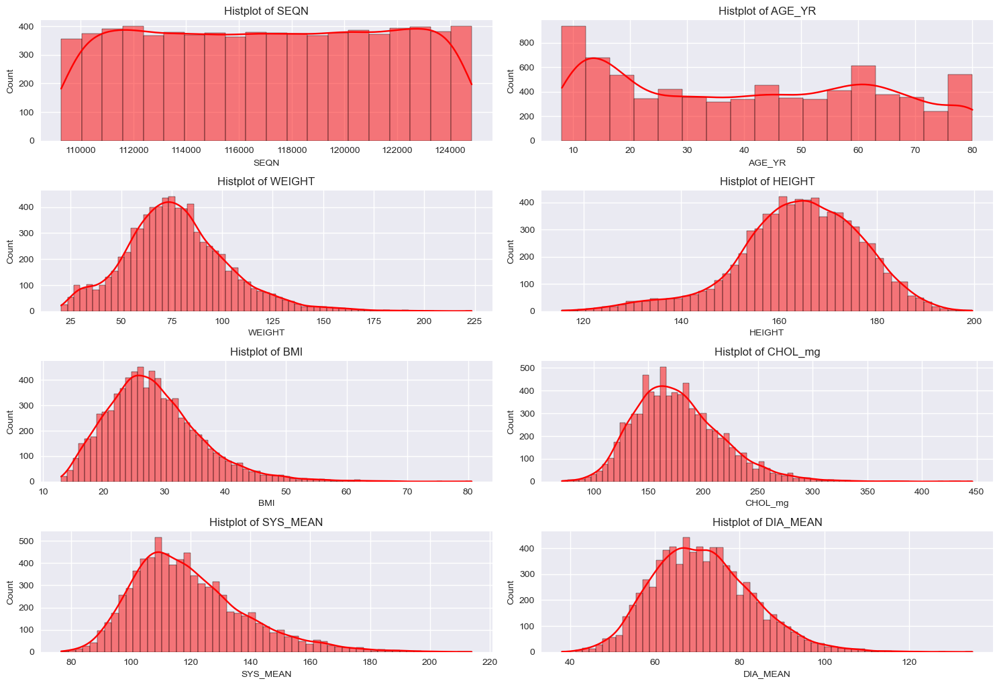

In [254]:
plt.figure(figsize = (15,15))
feature_list = numerical_features
for i in range(len(feature_list)):
    plt.subplot(6, 2, i + 1)
    sns.histplot(x = df_consolidated[feature_list[i]], data = df_consolidated,color="red",kde=True)
    plt.title('Histplot of {}'.format(feature_list[i]))
    plt.tight_layout()

In [321]:
plot1 = pd.DataFrame(df_consolidated['DIET'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["DIET","COUNT"]
plot1

,DIET,COUNT
0,Good,2458
1,Fair,1630
2,Unknown,1445
3,Very Good,1203
4,Excellant,430
5,Poor,419


### BOKEH PLOT - Interactive Plot with Interactive Tool Bar

In [540]:
from bokeh.palettes import Spectral10
from bokeh.plotting import figure, show
from bokeh.transform import factor_cmap
from bokeh.io import output_notebook
output_notebook()

DIET = plot1.DIET
COUNT = plot1.COUNT

TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

p = figure(x_range=DIET, height=600, title="DIETARY ANALYSIS", tools=TOOLS)

p.vbar(x='DIET', top='COUNT', width=0.9, source=plot1, legend_field="DIET",
       line_color='white', fill_color=factor_cmap('DIET', palette=Spectral10, factors=DIET))

p.xgrid.grid_line_color = None

p.legend.orientation = "horizontal"
p.legend.location = "top_center"

show(p)

Loading BokehJS ...

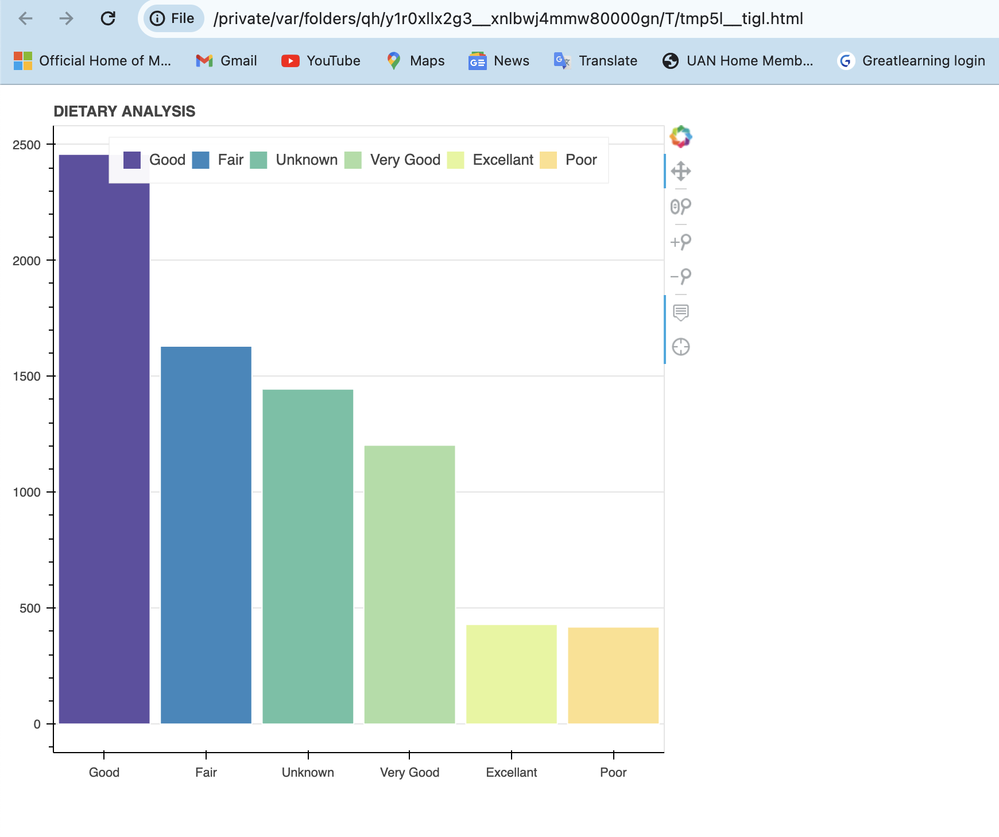

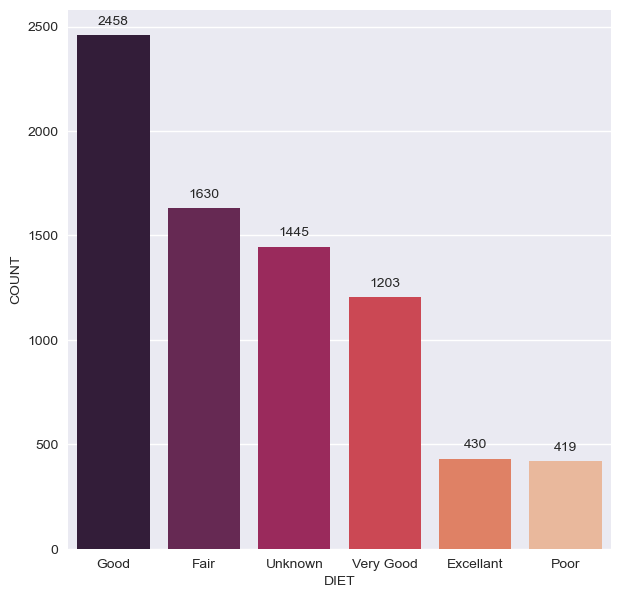

In [255]:
#Visual Representation of Categorical Variables in the dataset
#DIET
plot1 = pd.DataFrame(df_consolidated['DIET'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["DIET","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='DIET',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

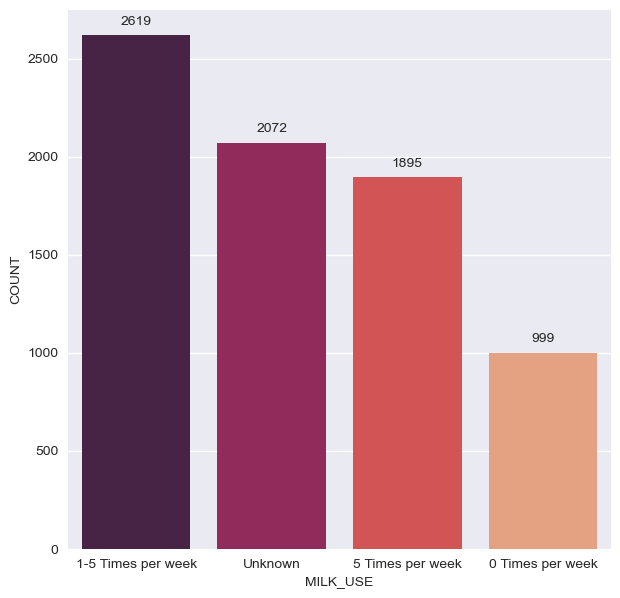

In [258]:
#Visual Representation of Categorical Variables in the dataset
#MILK USE
plot1 = pd.DataFrame(df_consolidated['MILK_USE'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_USE","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_USE',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

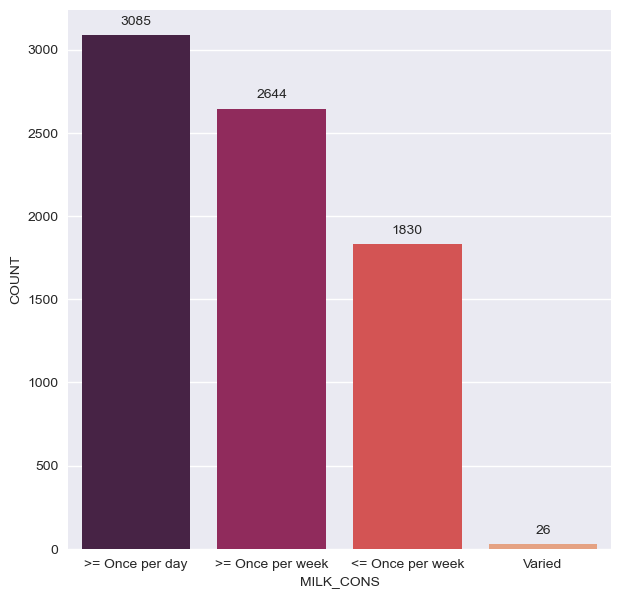

In [259]:
#Visual Representation of Categorical Variables in the dataset
#MILK CONSUMPTION
plot1 = pd.DataFrame(df_consolidated['MILK_CONS'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_CONS","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_CONS',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

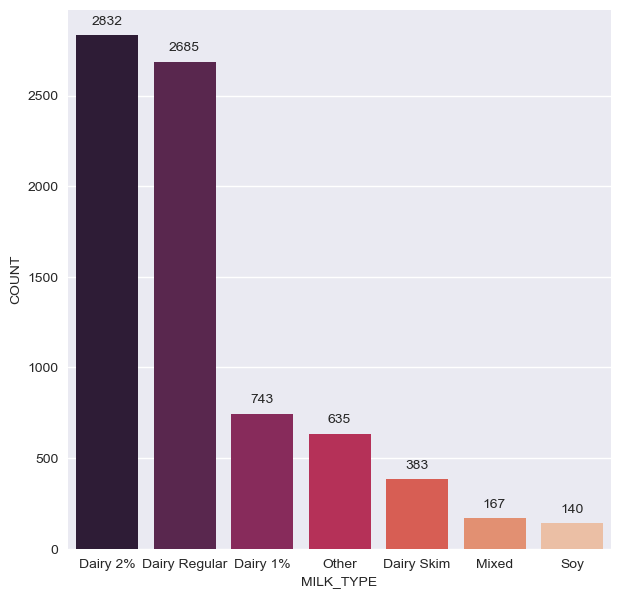

In [260]:
#Visual Representation of Categorical Variables in the dataset
#MILK TYPE
plot1 = pd.DataFrame(df_consolidated['MILK_TYPE'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MILK_TYPE","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MILK_TYPE',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

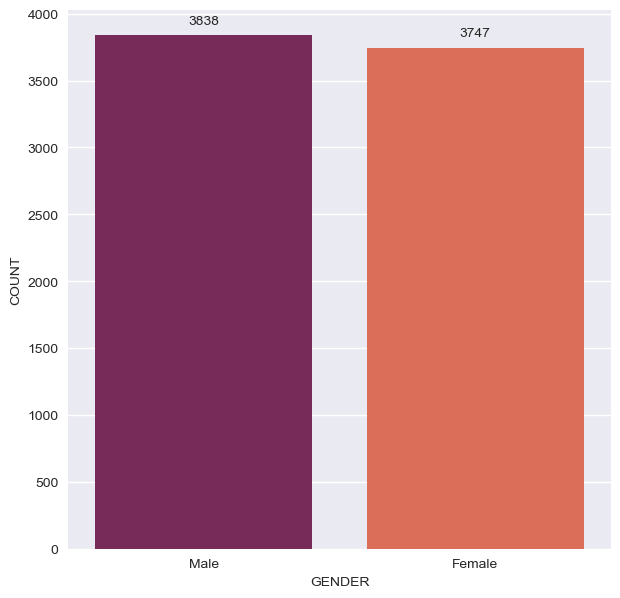

In [261]:
#Visual Representation of Categorical Variables in the dataset
#GENDER
plot1 = pd.DataFrame(df_consolidated['GENDER'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["GENDER","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='GENDER',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

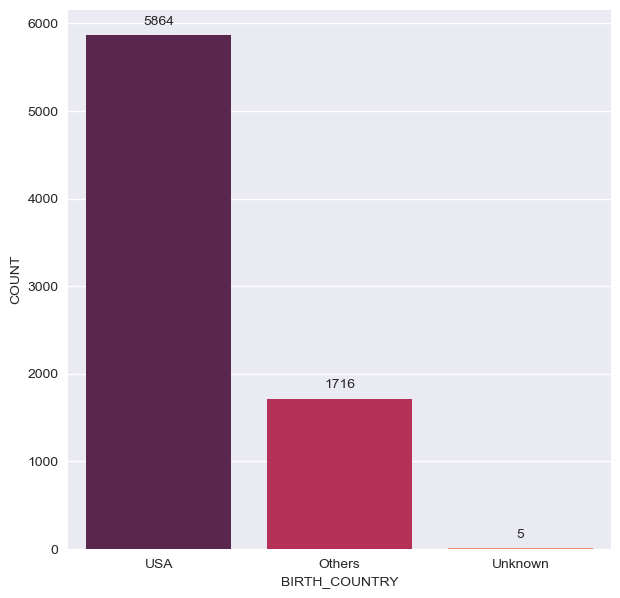

In [262]:
#Visual Representation of Categorical Variables in the dataset
#BIRTH COUNTRY
plot1 = pd.DataFrame(df_consolidated['BIRTH_COUNTRY'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["BIRTH_COUNTRY","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='BIRTH_COUNTRY',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

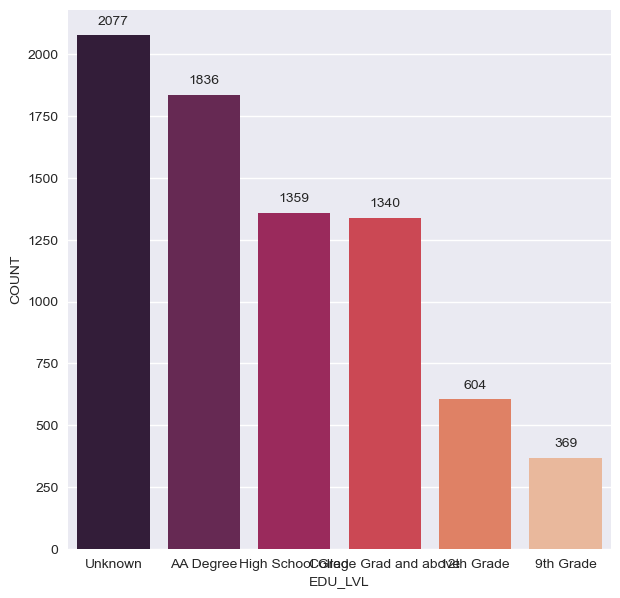

In [263]:
#Visual Representation of Categorical Variables in the dataset
#EDUCATIONAL LEVEL
plot1 = pd.DataFrame(df_consolidated['EDU_LVL'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["EDU_LVL","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='EDU_LVL',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

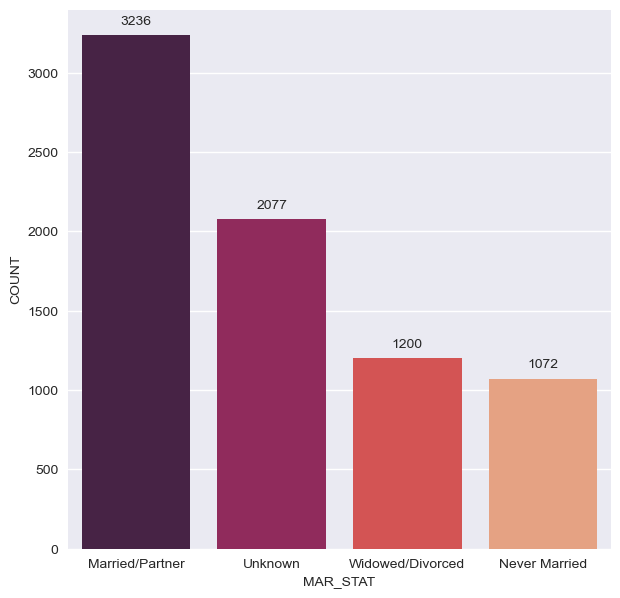

In [264]:
#Visual Representation of Categorical Variables in the dataset
#Marital Status
plot1 = pd.DataFrame(df_consolidated['MAR_STAT'].value_counts())
plot1 = plot1.reset_index()
plot1.columns = ["MAR_STAT","COUNT"]
fig_dims = (7, 7)
fig,ax = plt.subplots(figsize=fig_dims)
sns.barplot(x='MAR_STAT',y='COUNT',ax=ax,data=plot1,palette="rocket")
for z in ax.patches:
    ax.annotate(format(z.get_height(), '.0f'), (z.get_x() + z.get_width() / 2., z.get_height()), 
       ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

Text(0.5, 1.0, 'Age')

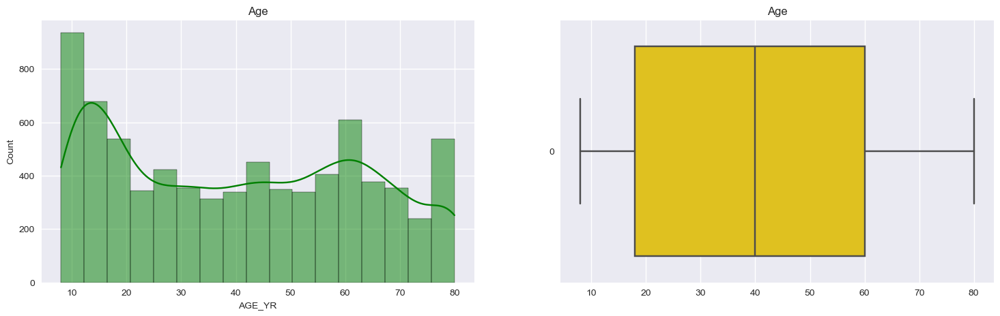

In [269]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['AGE_YR'] , ax=axes[0],kde=True,color='green')
viz.set_title("Age",fontsize=12)
viz = sns.boxplot(data = df_consolidated['AGE_YR'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Age",fontsize=12)

Text(0.5, 1.0, 'Weight')

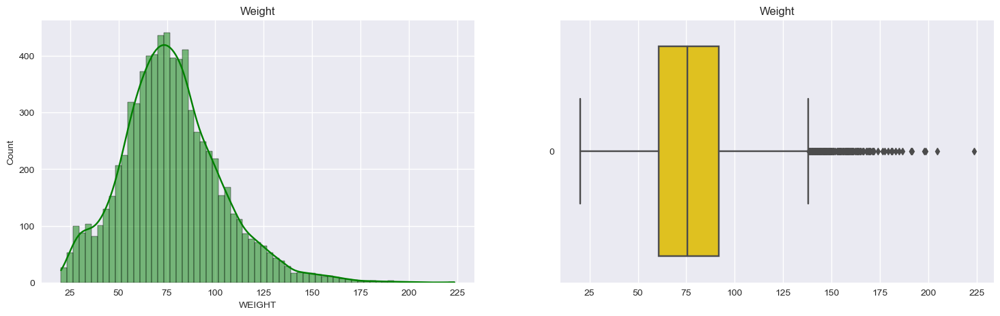

In [268]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['WEIGHT'] , ax=axes[0],kde=True,color='green')
viz.set_title("Weight",fontsize=12)
viz = sns.boxplot(data = df_consolidated['WEIGHT'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Weight",fontsize=12)

Text(0.5, 1.0, 'Height')

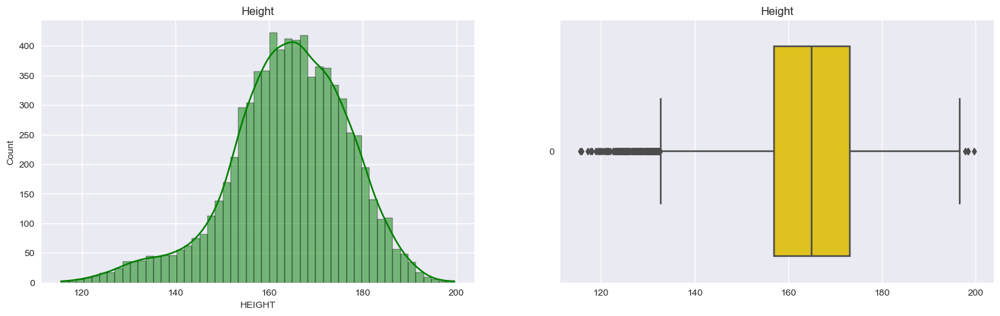

In [270]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['HEIGHT'] , ax=axes[0],kde=True,color='green')
viz.set_title("Height",fontsize=12)
viz = sns.boxplot(data = df_consolidated['HEIGHT'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Height",fontsize=12)

Text(0.5, 1.0, 'BMI')

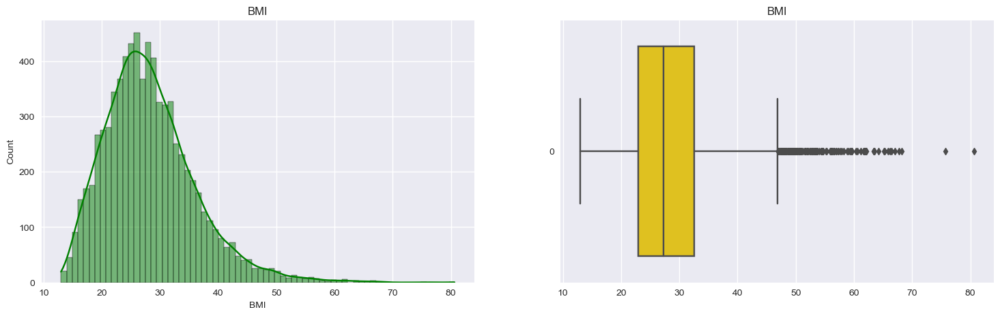

In [271]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['BMI'] , ax=axes[0],kde=True,color='green')
viz.set_title("BMI",fontsize=12)
viz = sns.boxplot(data = df_consolidated['BMI'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("BMI",fontsize=12)

Text(0.5, 1.0, 'Cholestrol')

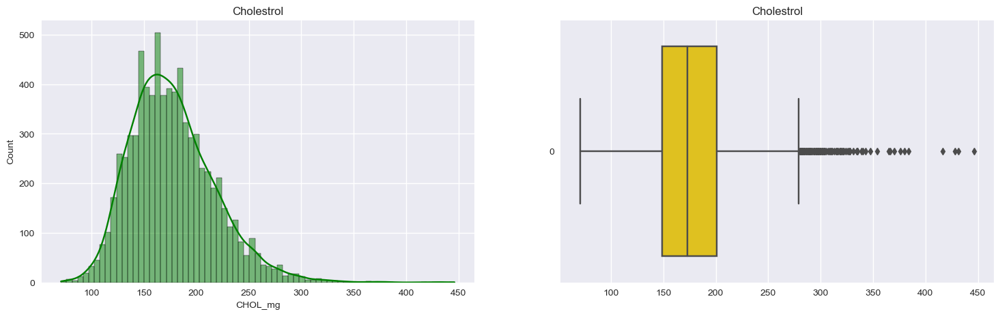

In [273]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['CHOL_mg'] , ax=axes[0],kde=True,color='green')
viz.set_title("Cholestrol",fontsize=12)
viz = sns.boxplot(data = df_consolidated['CHOL_mg'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Cholestrol",fontsize=12)

Text(0.5, 1.0, 'Systolic')

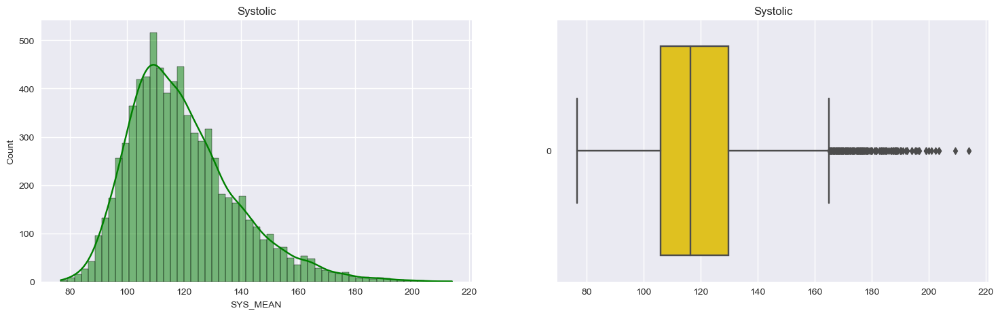

In [274]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['SYS_MEAN'] , ax=axes[0],kde=True,color='green')
viz.set_title("Systolic",fontsize=12)
viz = sns.boxplot(data = df_consolidated['SYS_MEAN'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Systolic",fontsize=12)

Text(0.5, 1.0, 'Diastolic')

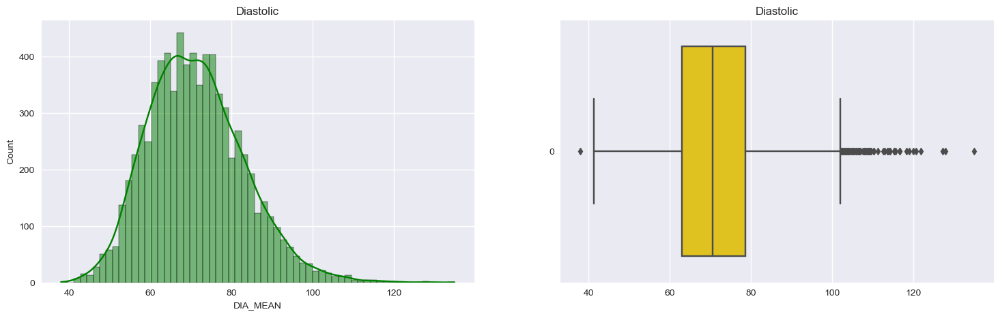

In [275]:
fig, axes = plt.subplots(nrows=1,ncols=2)
fig.set_size_inches(18,5)

viz = sns.histplot(data = df_consolidated['DIA_MEAN'] , ax=axes[0],kde=True,color='green')
viz.set_title("Diastolic",fontsize=12)
viz = sns.boxplot(data = df_consolidated['DIA_MEAN'] , orient = "h" , ax=axes[1],color='gold')
viz.set_title("Diastolic",fontsize=12)

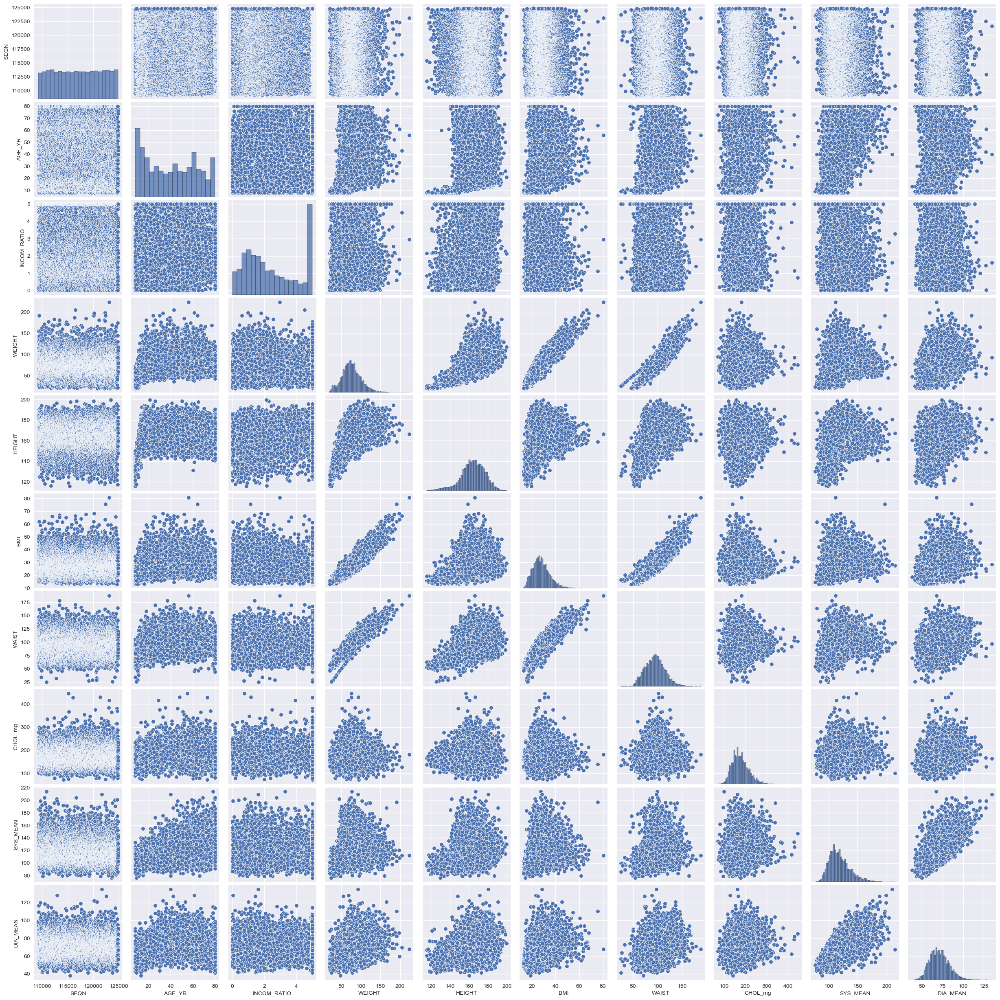

In [276]:
sns.pairplot(df_consolidated,kind='scatter');

In [277]:
consol_new_df = np.array(df_consolidated[['AGE_YR', 'BMI', 'CHOL_mg', 'SYS_MEAN', 'DIA_MEAN']])

rows = len(consol_new_df[:,0]) # Number of rows. 
cols = len(consol_new_df[0,:]) # Number of columns.
zscores = np.array([]) # New numpy array (for new matrix).

for i in range(cols): # for each column.
    z_col = np.array([]) # new column array (reset for each column).
    
    for j in range(rows): # for each element in current column.
        z_score = ((consol_new_df[j,i]-np.mean(consol_new_df[:,i]))/np.std(consol_new_df[:,i])).round(3) # Calculating the z score.
        z_col = np.append(z_col, z_score) # Appending to columns array.
    
    z_col = z_col.reshape(-1,1) # Reshaping  to new matrix
    
    if len(zscores) == 0: # If z_col is the first column.
        zscores = z_col
    else:
        zscores = np.append(zscores, z_col, axis=1) # Appending each z_col to the zscores matrix. 

print(zscores.shape)
zscores[:5,:] # Preview first 5 rows, all columns. 

(7585, 5)


array([[-1.223, -1.365, -0.278, -0.606, -0.367],
       [-0.513,  1.218,  0.44 , -1.085, -1.443],
       [-1.311,  0.335, -1.839,  0.28 ,  0.17 ],
       [ 0.373,  0.182, -0.749, -0.659, -0.367],
       [-0.203, -0.816, -0.328, -0.305, -0.339]])

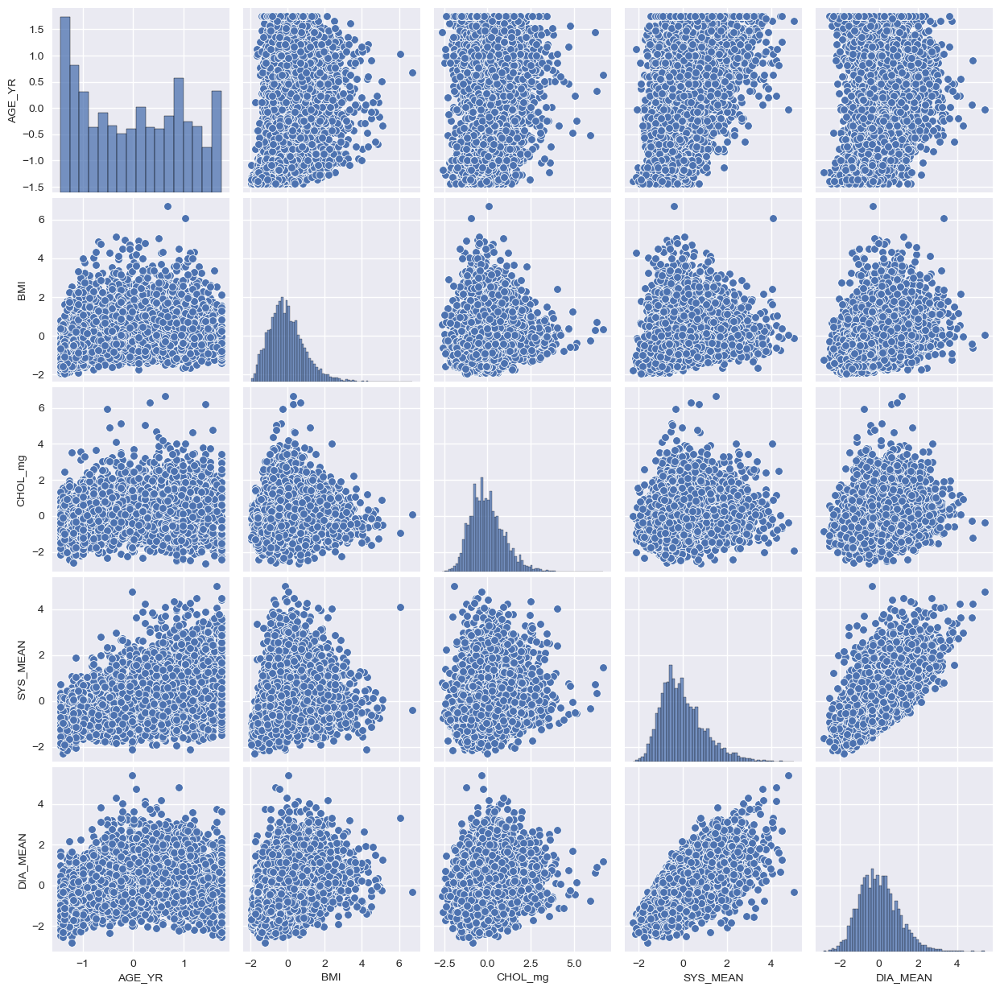

In [286]:
df_consol_metrics = pd.DataFrame(zscores, columns=['AGE_YR', 'BMI', 'CHOL_mg', 'SYS_MEAN', 'DIA_MEAN'])
sns.pairplot(data = df_consol_metrics);

### Bokeh Plot - of Variables that have a Linear Relationship 

In [541]:
from bokeh.palettes import Viridis256
from bokeh.layouts import column, gridplot
from bokeh.models import ColumnDataSource
from bokeh.palettes import Viridis256
from bokeh.plotting import figure, show
from bokeh.transform import linear_cmap, log_cmap
output_notebook()


SYS_MEAN = df_consol_metrics.SYS_MEAN
DIA_MEAN = df_consol_metrics.DIA_MEAN
source = ColumnDataSource(dict(SYS_MEAN=SYS_MEAN,DIA_MEAN=DIA_MEAN))

TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

p = figure(x_range=(-3, 6), width=800, height=300, tools=TOOLS,
            title="Systolic Mean Vs Diastolic Mean")

#p.scatter(x='SYS_MEAN', y='DIA_MEAN', alpha=0.8, source=plot1, legend_field="SYS_MEAN",
       #line_color='white', fill_color=factor_cmap('SYS_MEAN', palette=Viridis256, factors=DIET))
    
cmap = linear_cmap("SYS_MEAN", palette="Viridis256", low=200, high=800,
                   low_color="blue", high_color="navy")

p.scatter(x='SYS_MEAN', y='DIA_MEAN', alpha=0.8, source=source, color=cmap)


p.xgrid.grid_line_color = None

p.legend.orientation = "horizontal"
p.legend.location = "top_center"

show(p)

Loading BokehJS ...

/Users/surajmathewthomas/anaconda3/lib/python3.10/site-packages/bokeh/models/plots.py:815: UserWarning:


You are attempting to set `plot.legend.orientation` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.


/Users/surajmathewthomas/anaconda3/lib/python3.10/site-packages/bokeh/models/plots.py:815: UserWarning:


You are attempting to set `plot.legend.location` on a plot that has zero legends added, this will have no effect.

Before legend properties can be set, you must add a Legend explicitly, or call a glyph method with a legend parameter set.




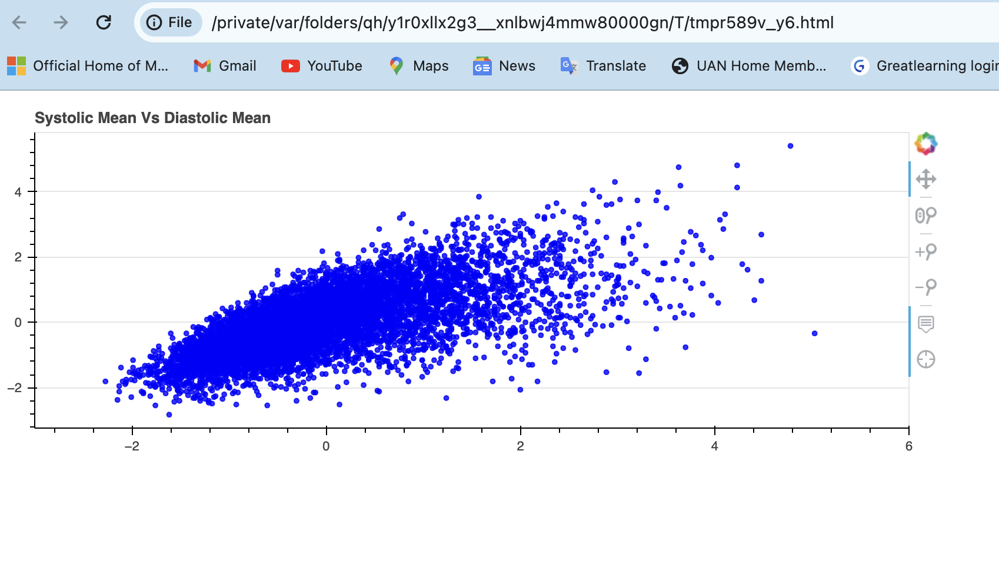

In [542]:
from bokeh.palettes import Viridis256
from bokeh.layouts import column, gridplot
from bokeh.models import ColumnDataSource
from bokeh.palettes import Viridis256
from bokeh.plotting import figure, show
from bokeh.transform import linear_cmap, log_cmap
output_notebook()


WEIGHT = df_consolidated.WEIGHT
BMI = df_consolidated.BMI
source1 = ColumnDataSource(dict(WEIGHT=WEIGHT,BMI=BMI))

BMI = df_consolidated.BMI
WAIST = df_consolidated.WAIST
source2 = ColumnDataSource(dict(BMI=BMI,WAIST=WAIST))

WEIGHT = df_consolidated.WEIGHT
WAIST = df_consolidated.WAIST
source3 = ColumnDataSource(dict(WEIGHT=WEIGHT,WAIST=WAIST))

WEIGHT = df_consolidated.WEIGHT
HEIGHT = df_consolidated.WAIST
source4 = ColumnDataSource(dict(WEIGHT=WEIGHT,HEIGHT=HEIGHT))



TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

p1 = figure(x_range=(0, 250), width=800, height=300, tools=TOOLS,
            title="WEIGHT Vs BMI")
    
cmap = linear_cmap("WEIGHT", palette="Viridis256", low=200, high=800,
                   low_color="green", high_color="navy")

p1.scatter(x='WEIGHT', y='BMI', alpha=0.8, source=source1, color=cmap)


#########

p2 = figure(x_range=(0, 150), width=800, height=300, tools=TOOLS,
            title="BMI Vs WAIST")
p2.scatter(x='BMI', y='WAIST', alpha=0.8, source=source2)

#########

p3 = figure(x_range=(0, 200), width=800, height=300, tools=TOOLS,
            title="WEIGHT Vs WAIST")
p3.scatter(x='WEIGHT', y='WAIST', alpha=0.8, source=source3, color=cmap)

#########

p4 = figure(x_range=(0, 200), width=800, height=300, tools=TOOLS,
            title="WEIGHT Vs HEIGHT")
p4.scatter(x='WEIGHT', y='HEIGHT', alpha=0.8, source=source4, color=cmap)

#########

grid =  gridplot([[p1, p2],[p3,p4]], width=400, height=300)

show(column(grid))


Loading BokehJS ...

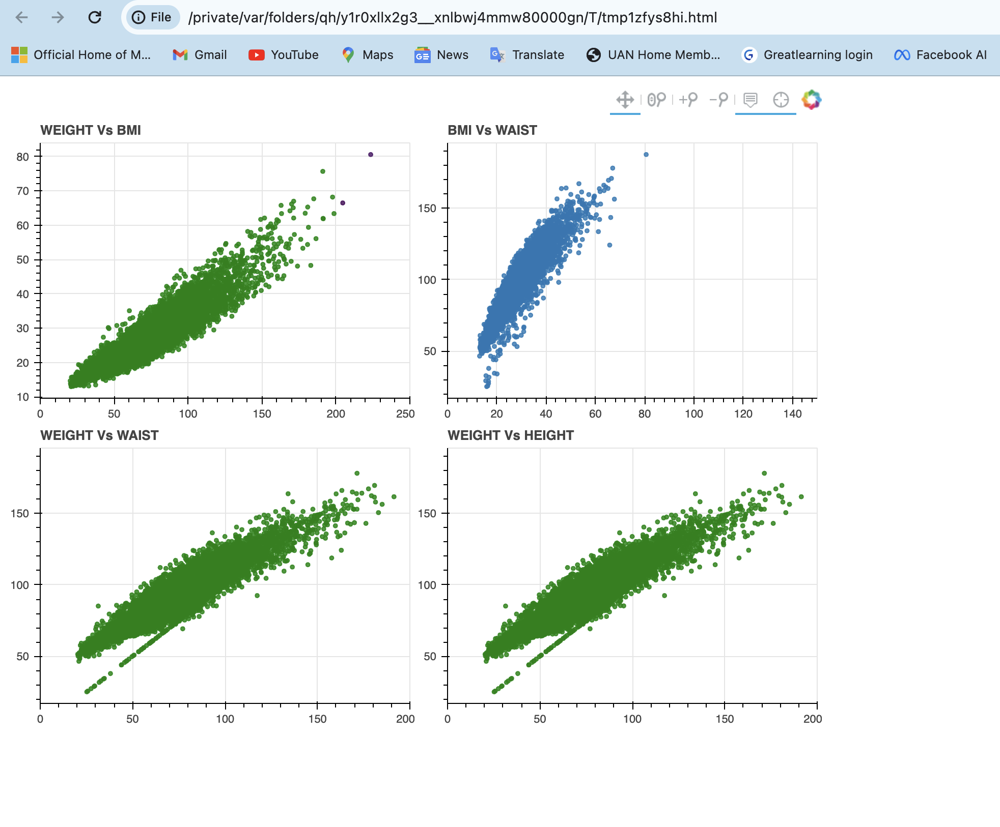

#### We can see that there is only a linear relationship between the SYS_MEAN and DIA_MEAN

/var/folders/qh/y1r0xllx2g3__xnlbwj4mmw80000gn/T/ipykernel_71917/3275941771.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  annot=True, fmt='.2f', cmap=cm.get_cmap('BuPu')


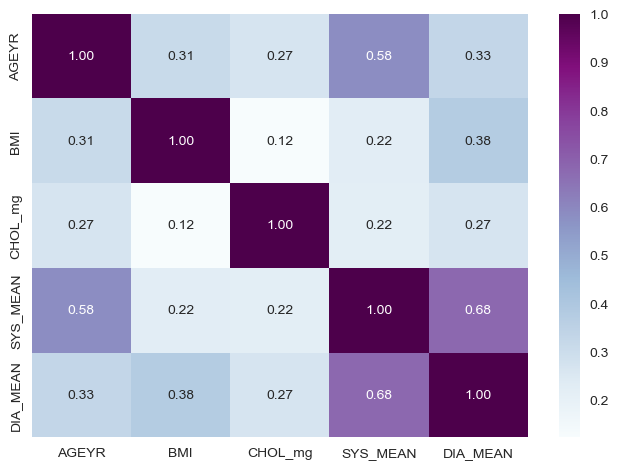

In [295]:
corr_order = [0, 1, 2, 3, 4]
cols = np.array(['AGEYR', 'BMI', 'CHOL_mg', 'SYS_MEAN', 'DIA_MEAN'])
PC = np.corrcoef(zscores.T)

sns.heatmap(
    PC[np.ix_(corr_order, corr_order)],
    xticklabels=cols[corr_order],
    yticklabels=cols[corr_order],
    annot=True, fmt='.2f', cmap=cm.get_cmap('BuPu')
);

####  We can see that there is a weak positive correlation between the age of the person and the systolic blood preasure. This could point to the possibility that blood pressure could increase with age. 

#### There is no other interesting correlations that can be seen.

#### Let us see if Cholestrol is related to increase consumption of Milk

In [401]:
Older_than_30_group = df_consolidated.AGE_YR >= 30 # 30+ Group
Younger_than_30_group = df_consolidated.AGE_YR < 30 # < 30 Group

Older_than_30 = df_consolidated.loc[Older_than_30_group, ['MILK_TYPE', 'CHOL_mg', 'GENDER']]
Younger_than_30 = df_consolidated.loc[Younger_than_30_group, ['MILK_TYPE', 'CHOL_mg', 'GENDER']]

# Generating a new column for Cholesterol Categories, >= 30 years old. 
high_30_plus = Older_than_30['CHOL_mg'] >= 239
low_30_plus = Older_than_30['CHOL_mg'] <= 200
Older_than_30['Classification'] = np.where(high_30_plus==True, 'High Cholesterol',
                                      (np.where(low_30_plus==True, 'Normal', 'Borderline'))) 

# Generating a new column for Cholesterol Categories, < 30 years old. 
high_less_30 = Younger_than_30['CHOL_mg'] >= 200
low_less_30 = Younger_than_30['CHOL_mg'] < 170
Younger_than_30['Classification'] = np.where(high_less_30==True, 'High Cholesterol',
                                      (np.where(low_less_30==True, 'Normal', 'Borderline'))) 

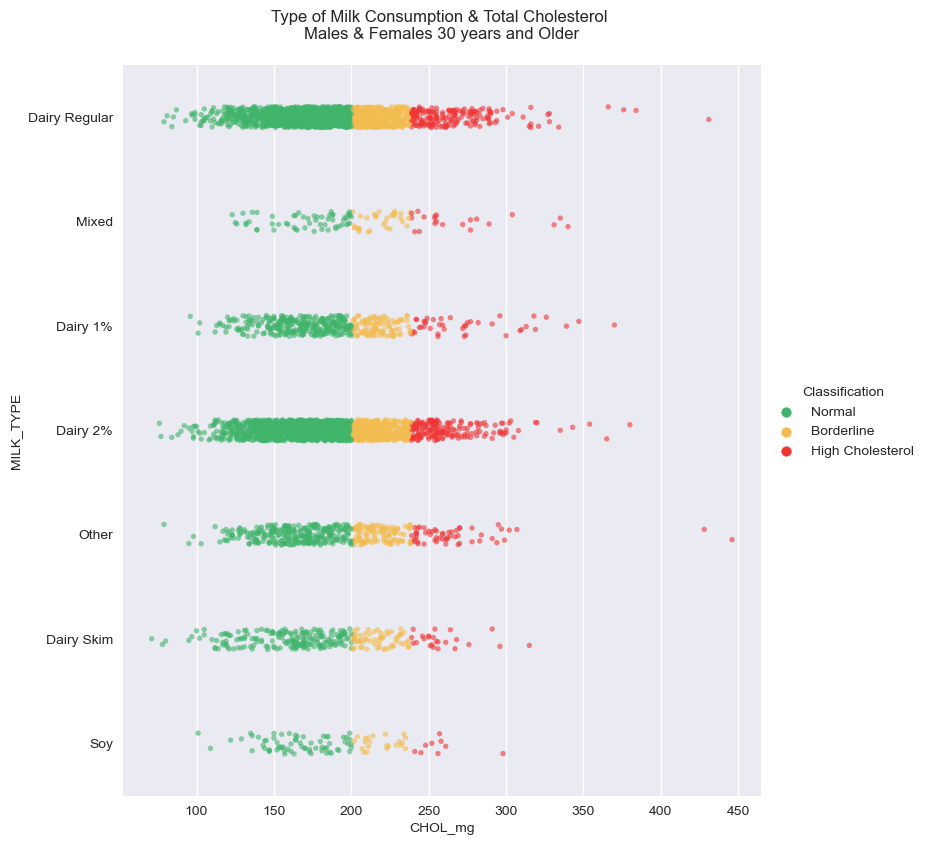

In [402]:
sns.catplot(data= Older_than_30, 
            y="MILK_TYPE", x="CHOL_mg", 
            hue='Classification', height=8, 
            palette=['#40b46b', '#f4bc50', '#f03535'],
            alpha=0.6, s=15)

plt.title('Type of Milk Consumption & Total Cholesterol \nMales & Females 30 years and Older\n', fontsize=12)
plt.show();

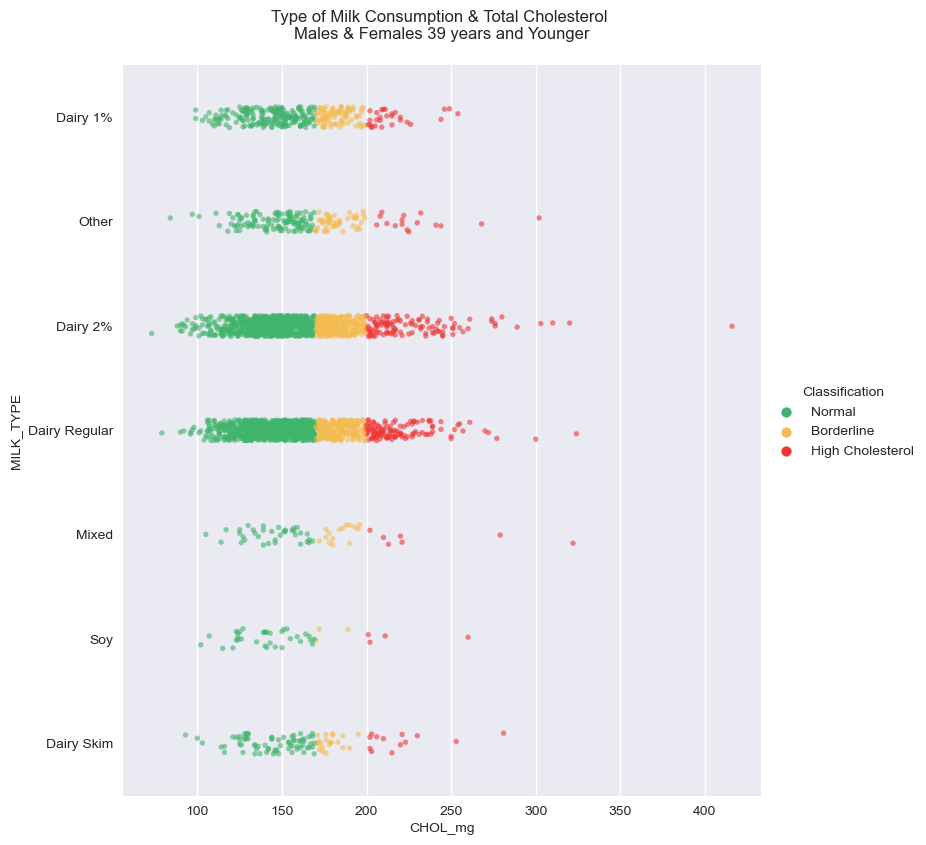

In [403]:
sns.catplot(data= Younger_than_30, 
            y="MILK_TYPE", x="CHOL_mg", 
            hue='Classification', height=8, 
            palette=['#40b46b', '#f4bc50', '#f03535'],
            alpha=0.6, s=15)

plt.title('Type of Milk Consumption & Total Cholesterol \nMales & Females 39 years and Younger\n', fontsize=12)
plt.show();

### Bokeh Plots - Depicting the Above Two Plots using Bokeh for introducing Interactivity

In [543]:
from bokeh.palettes import Viridis256
from bokeh.layouts import column, gridplot
from bokeh.models import ColumnDataSource
from bokeh.palettes import Viridis256
from bokeh.plotting import figure, show
from bokeh.transform import linear_cmap, log_cmap
output_notebook()


CHOL = Older_than_30.CHOL_mg
MILK_TYPE = Older_than_30.MILK_TYPE
source5 = ColumnDataSource(dict(CHOL=CHOL,MILK_TYPE=MILK_TYPE))
classes = list(sorted(Older_than_30["MILK_TYPE"].unique()))


TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

p1 = figure(y_range=classes, width=800, height=600, tools=TOOLS,
            title="Type of Milk Consumption & Total Cholesterol for Males & Females 30 years and Older")
    
cmap = linear_cmap("CHOL", palette="Viridis256", low=200, high=800,
                   low_color="green", high_color="blue")

p1.scatter(x='CHOL', y='MILK_TYPE', alpha=0.8, source=source5, color=cmap)

p1.xgrid.grid_line_color = None




p1.legend.orientation = "horizontal"

p1.legend.location = "top_center"

show(p1)


Loading BokehJS ...

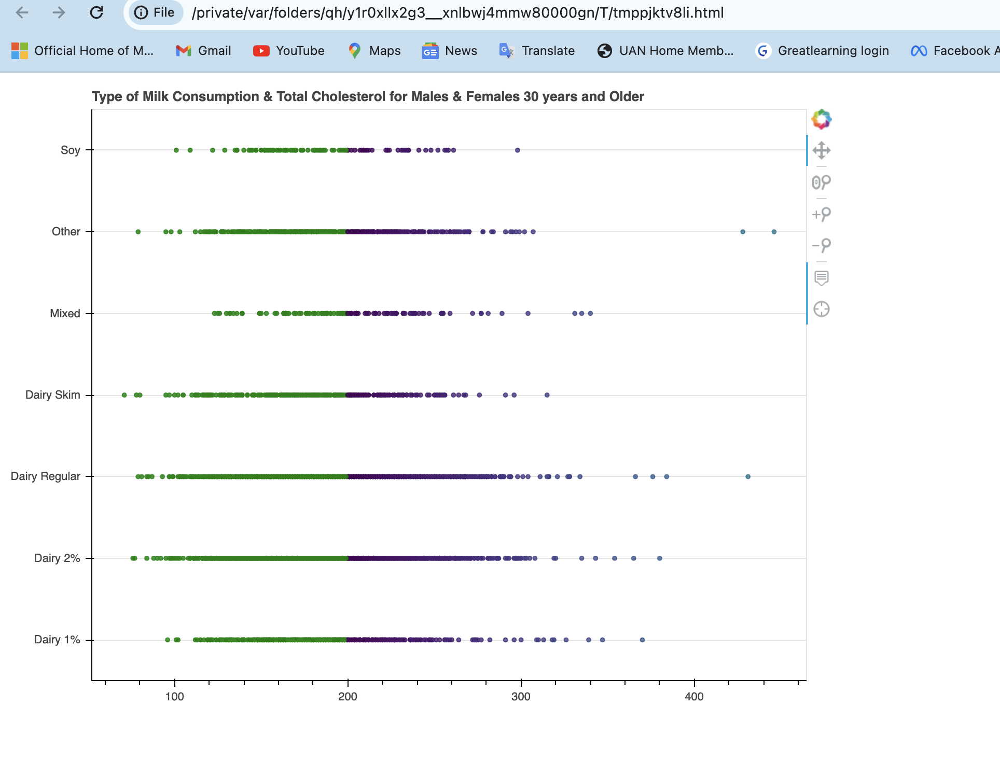

In [544]:
from bokeh.palettes import Viridis256
from bokeh.layouts import column, gridplot
from bokeh.models import ColumnDataSource
from bokeh.palettes import Viridis256
from bokeh.plotting import figure, show
from bokeh.transform import linear_cmap, log_cmap
output_notebook()


CHOL = Younger_than_30.CHOL_mg
MILK_TYPE = Younger_than_30.MILK_TYPE
source6 = ColumnDataSource(dict(CHOL=CHOL,MILK_TYPE=MILK_TYPE))
classes = list(sorted(Younger_than_30["MILK_TYPE"].unique()))


TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

p2 = figure(y_range=classes, width=800, height=600, tools=TOOLS,
            title="Type of Milk Consumption & Total Cholesterol for Males & Females Younger than 30 Years")
    
cmap = linear_cmap("CHOL", palette="Viridis256", low=200, high=800,
                   low_color="green", high_color="blue")

p2.scatter(x='CHOL', y='MILK_TYPE', alpha=0.8, source=source6, color=cmap)

p2.xgrid.grid_line_color = None




p2.legend.orientation = "horizontal"

p2.legend.location = "top_center"

show(p2)


Loading BokehJS ...

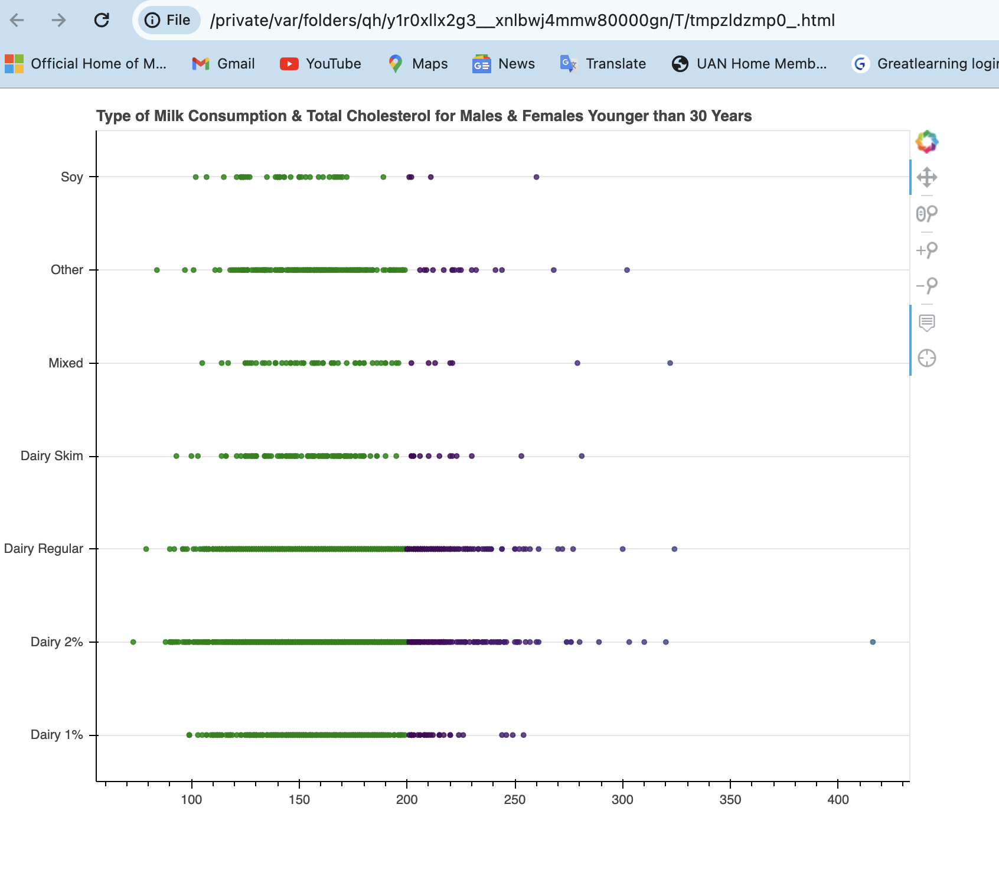

In [421]:
df_young_30 = pd.DataFrame(Younger_than_30.MILK_TYPE.value_counts())
df_young_30

,MILK_TYPE
Dairy Regular,1120
Dairy 2%,1109
Dairy 1%,303
Other,181
Dairy Skim,106
Mixed,58
Soy,41


In [422]:
df_older_30 = pd.DataFrame(Older_than_30.MILK_TYPE.value_counts())
df_older_30

,MILK_TYPE
Dairy 2%,1723
Dairy Regular,1565
Other,454
Dairy 1%,440
Dairy Skim,277
Mixed,109
Soy,99


#### There is almost a similar distribution between the two groups. Soy Milk Consumers are the least and therefore the plot shown is scanty.

#### Let us see the distribution of consumption of the milk type using a tree plot. We will use Squarify and see how the plot turns out

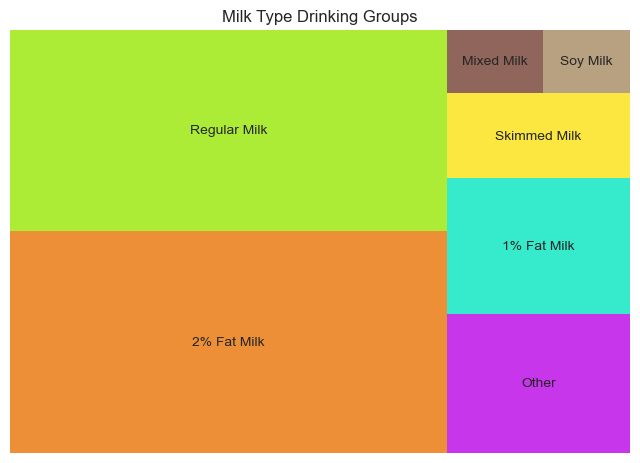

In [431]:
labels = ['2% Fat Milk', 'Regular Milk', 'Other', '1% Fat Milk', 'Skimmed Milk', 'Mixed Milk', 'Soy Milk']
colours = ['#E87304', '#99E804', '#B904E6', '#04E6C0', '#FAE10F', '#753E32', '#A78A61']

squarify.plot(sizes = Older_than_30.MILK_TYPE.value_counts(), 
              label=labels, alpha=0.8, color=colours)
plt.axis('off')
plt.title('Milk Type Drinking Groups', fontsize=12)
plt.show()

#### Regular Milk and the 2% Fat Milk are the most popular milk types.  Soy Milk and the Mixed Milk types are the least consumed types

In [545]:
from bokeh.models import ColumnDataSource, Whisker
from bokeh.plotting import figure, show
from bokeh.palettes import Spectral8
from bokeh.transform import factor_cmap, jitter
output_notebook()


classes = list(sorted(Older_than_30["MILK_TYPE"].unique()))

p = figure(height=700, x_range=classes, background_fill_color="#efefef",
           title="Whisker Plots of Consumed Milk Types and the Cholestrol Level of the Person")
p.xgrid.grid_line_color = None

g = Older_than_30.groupby("MILK_TYPE")
upper = g.CHOL_mg.quantile(0.80)
lower = g.CHOL_mg.quantile(0.20)
source = ColumnDataSource(data=dict(base=classes, upper=upper, lower=lower))

error = Whisker(base="base", upper="upper", lower="lower", source=source,
                level="annotation", line_width=2)
error.upper_head.size=20
error.lower_head.size=20
p.add_layout(error)

index_cmap = factor_cmap('MILK_TYPE', 
                         palette=Spectral8, 
                         factors=sorted(Older_than_30.MILK_TYPE.unique()), 
                         start=1, end=2)

p.circle(jitter("MILK_TYPE", 0.3, range=p.x_range), "CHOL_mg", source=Older_than_30,
         alpha=0.8, size=13, line_color="white",
         color=index_cmap)

show(p)

Loading BokehJS ...

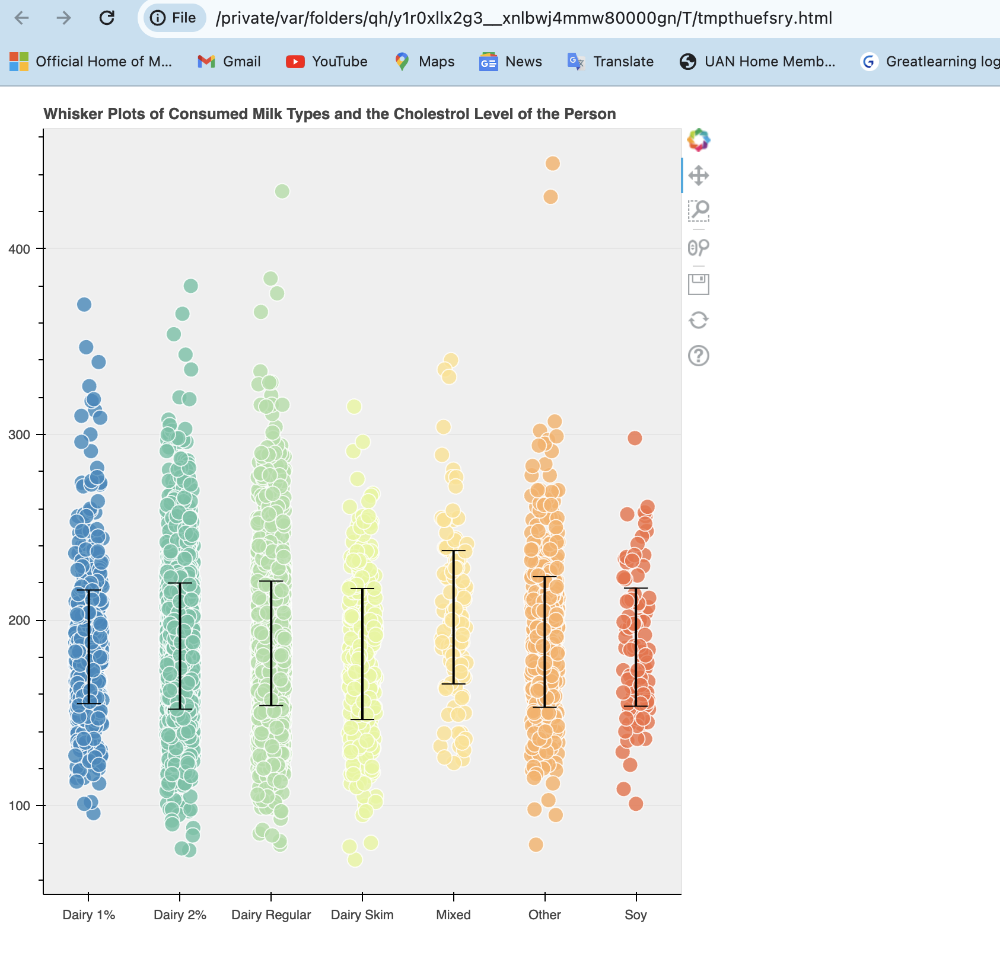

In [546]:
from bokeh.models import ColumnDataSource, Whisker
from bokeh.plotting import figure, show
from bokeh.palettes import Spectral8
from bokeh.transform import factor_cmap
output_notebook()



df = Older_than_30[["MILK_TYPE", "CHOL_mg"]]

kinds = df.MILK_TYPE.unique()

TOOLS="hover,crosshair,pan,wheel_zoom,zoom_in,zoom_out"

# compute quantiles
qs = df.groupby("MILK_TYPE").CHOL_mg.quantile([0.25, 0.5, 0.75])
qs = qs.unstack().reset_index()
qs.columns = ["MILK_TYPE", "q1", "q2", "q3"]
df = pd.merge(df, qs, on="MILK_TYPE", how="left")

# compute IQR outlier bounds
iqr = df.q3 - df.q1
df["upper"] = df.q3 + 1.5*iqr
df["lower"] = df.q1 - 1.5*iqr

source = ColumnDataSource(df)

p = figure(x_range=kinds, tools=TOOLS,
           title="Whisker Plots of Consumed Milk Types and the Cholestrol Level of the Person",
           background_fill_color="#eaefef", y_axis_label="Cholestrol Level")

# outlier range
whisker = Whisker(base="MILK_TYPE", upper="upper", lower="lower", source=source)
whisker.upper_head.size = whisker.lower_head.size = 20
p.add_layout(whisker)

# quantile boxes
cmap = factor_cmap("MILK_TYPE", "Spectral8", kinds)
p.vbar("MILK_TYPE", 0.7, "q2", "q3", source=source, color=cmap, line_color="black")
p.vbar("MILK_TYPE", 0.7, "q1", "q2", source=source, color=cmap, line_color="black")

# outliers
outliers = df[~df.CHOL_mg.between(df.lower, df.upper)]
p.scatter("MILK_TYPE", "CHOL_mg", source=outliers, size=6, color="black", alpha=0.3)

p.xgrid.grid_line_color = None
p.axis.major_label_text_font_size="14px"
p.axis.axis_label_text_font_size="12px"

show(p)

Loading BokehJS ...

df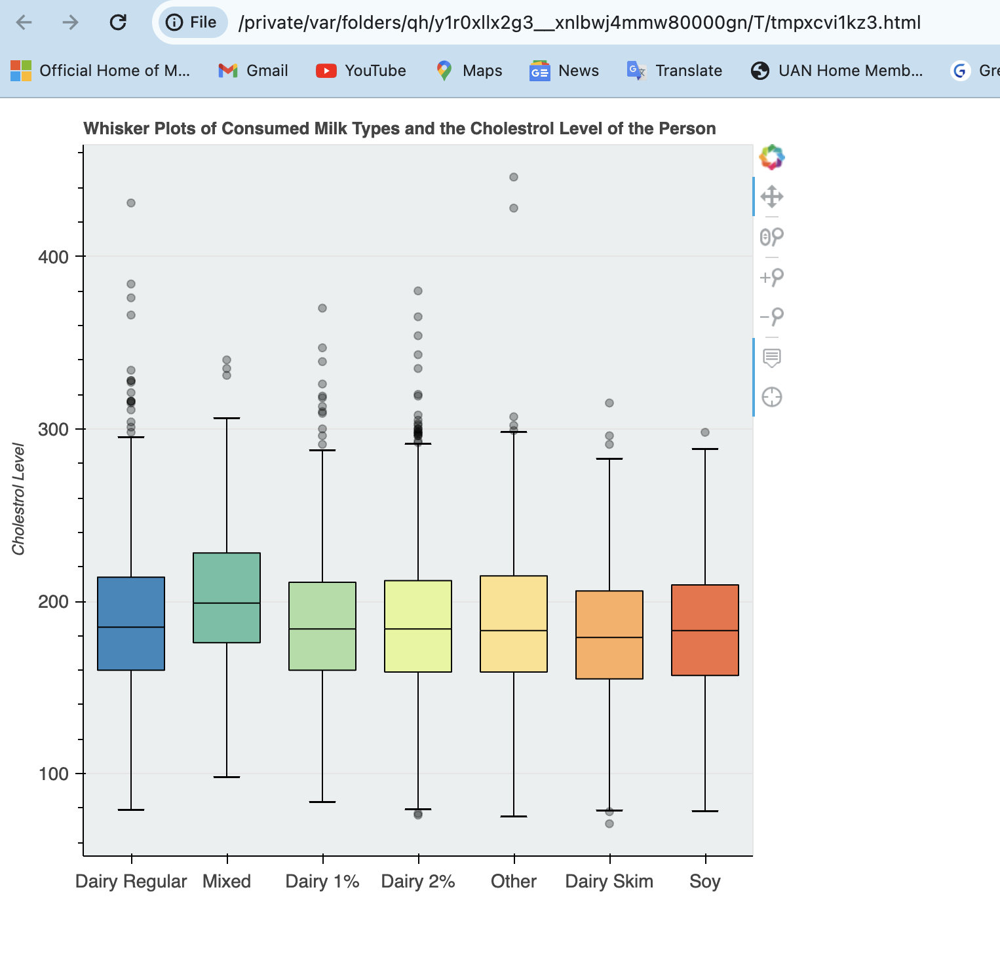

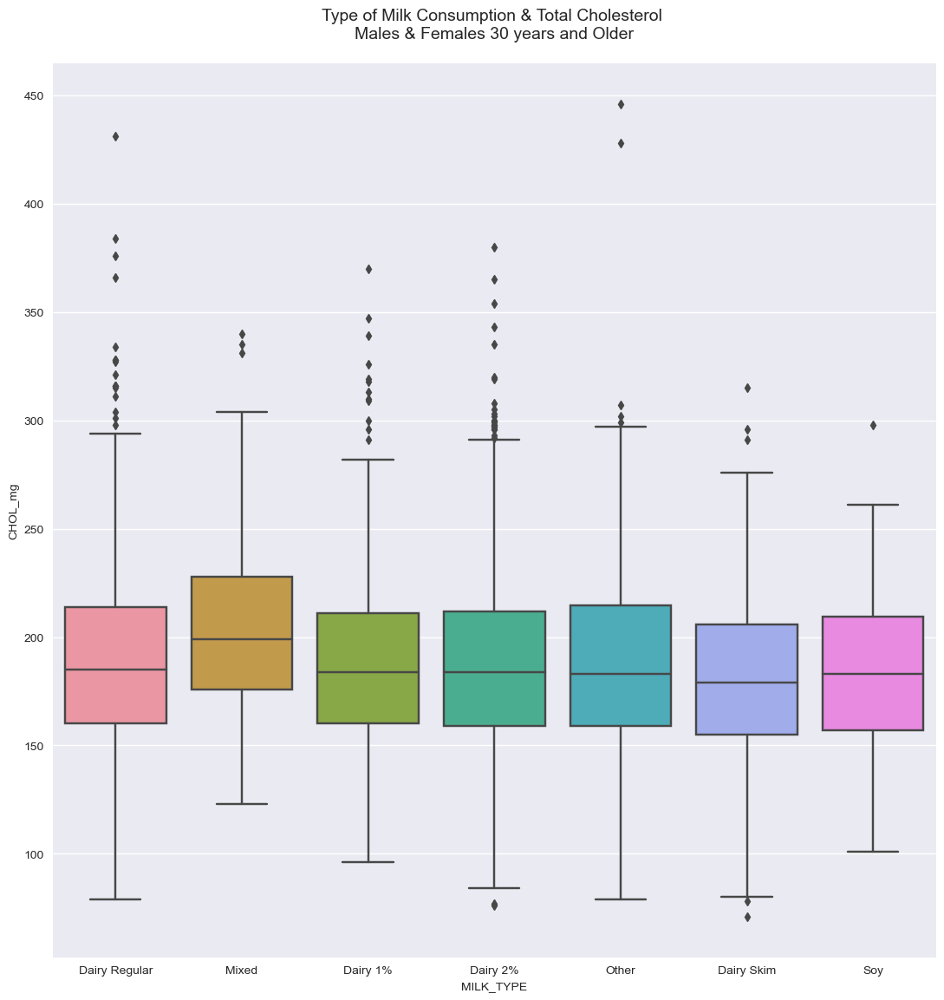

In [455]:
sns.catplot(data = Older_than_30, 
            y='CHOL_mg', x='MILK_TYPE', kind="box", height=11)

plt.title('Type of Milk Consumption & Total Cholesterol \nMales & Females 30 years and Older\n', fontsize=14)
plt.show();

#### The above visuals infer that there is very little to no difference between the type of milk a person consumes and their bodily cholestrol levels

#### People who drink soy milk seems to have total cholestrol levels below the high classification. This factor alone may not be enough to infer about cholestrol levels. We would also need to take into consideration the other foods in their diet they eat, their exercise and other lifestyle patterns. Nearly 75% of the soy milk drinkers have normal cholestrol.

#### More than 50% of the mixed milk drinkers have total cholestrol levels that are on either the borderline or high level. (*>200 = Borderline >239 = High*)


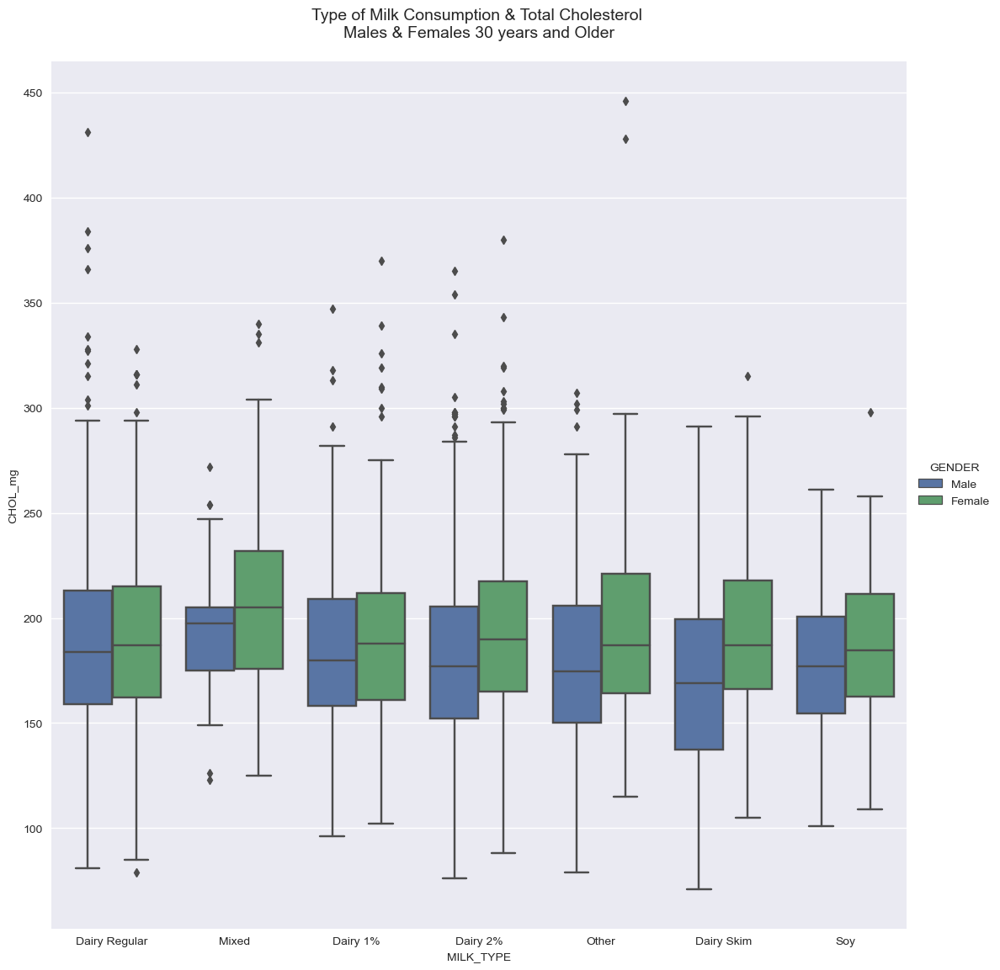

In [456]:
sns.catplot(data = Older_than_30, 
            y='CHOL_mg', x='MILK_TYPE', kind="box", height=11, hue="GENDER")

plt.title('Type of Milk Consumption & Total Cholesterol \nMales & Females 30 years and Older\n', fontsize=14)
plt.show();

#### The women are represented by the Green Box Plots and the men are represented by the Blue Box Plots. These plots show side by side as to how the distribution of cholestrol is vs the type of milk consumed bifurcated by the Gender.

#### We can see that the women have a higher mean cholestrol level when compared to the men

### Amount of Milk Consumed

In [458]:
df_consolidated.columns

Index(['SEQN', 'DIET', 'MILK_CONS', 'MILK_USE', 'MILK_TYPE', 'GENDER',
       'AGE_YR', 'BIRTH_COUNTRY', 'EDU_LVL', 'MAR_STAT', 'INCOM_RATIO',
       'WEIGHT', 'HEIGHT', 'BMI', 'WAIST', 'CHOL_mg', 'SYS_MEAN', 'DIA_MEAN'],
      dtype='object')

In [459]:
df_consolidated.MILK_USE.value_counts()

1-5 Times per week    2619
Unknown               2072
5 Times per week      1895
0 Times per week       999
Name: MILK_USE, dtype: int64

In [461]:
#Dividing into 2 Groups as we did before to further our analysis

Condition_Greater_than_30 = df_consolidated.AGE_YR >= 30
Greater_than_30 = df_consolidated.loc[Condition_Greater_than_30, ['MILK_TYPE', 'CHOL_mg', 'GENDER', 'MILK_USE']]

high_use_1 = Greater_than_30.MILK_USE == '5 Times per week'
mid_use_1 = Greater_than_30.MILK_USE == '1-5 Times per week'
low_use_1 = Greater_than_30.MILK_USE == '0 Times per week'

high_use = Greater_than_30.loc[high_use_1, ['MILK_TYPE', 'CHOL_mg', 'GENDER']]
mid_use = Greater_than_30.loc[mid_use_1, ['MILK_TYPE', 'CHOL_mg', 'GENDER']]
low_use = Greater_than_30.loc[low_use_1, ['MILK_TYPE', 'CHOL_mg', 'GENDER']]

In [465]:
# Determining the required ranges. 

print(f'High Use Min Cap:\t{high_use.CHOL_mg.min()}\nHigh Use Max Cap:\t{high_use.CHOL_mg.max()}')
print(f'Low Use Min Cap:\t{low_use.CHOL_mg.min()}\nLow Use Max Cap:\t{low_use.CHOL_mg.max()}')

High Use Min Cap:	76.0
High Use Max Cap:	431.0
Low Use Min Cap:	85.0
Low Use Max Cap:	428.0


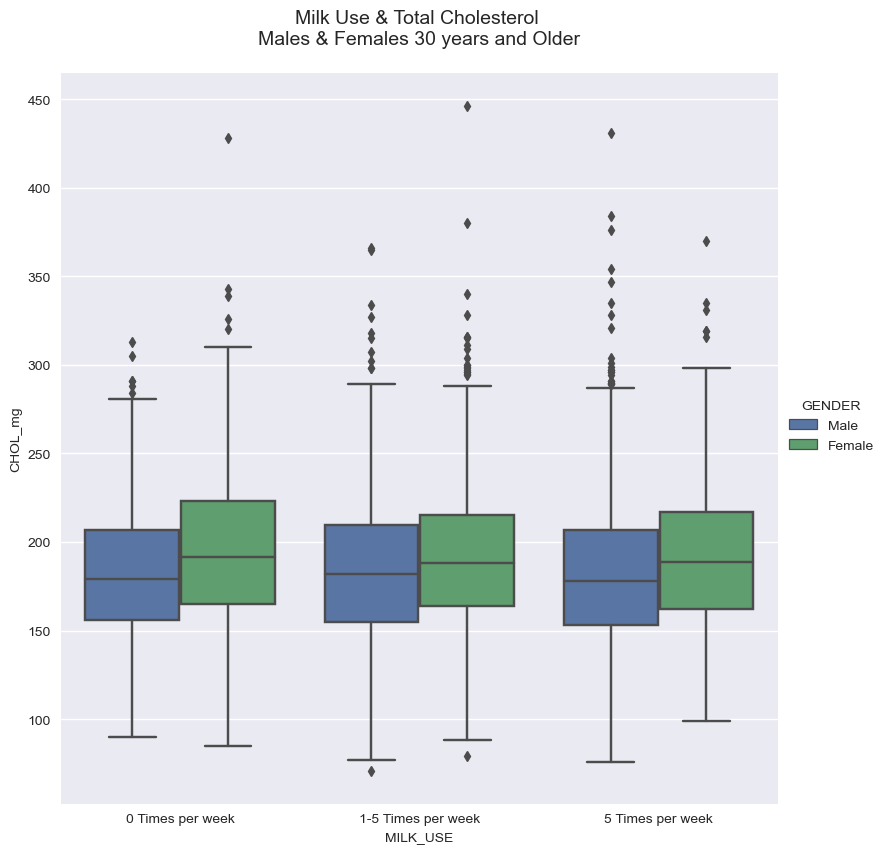

In [469]:
sns.catplot(data = Greater_than_30, 
            y='CHOL_mg', x='MILK_USE', kind='box', height=8, hue='GENDER')

plt.title('Milk Use & Total Cholesterol \nMales & Females 30 years and Older\n', fontsize=14)
plt.show();

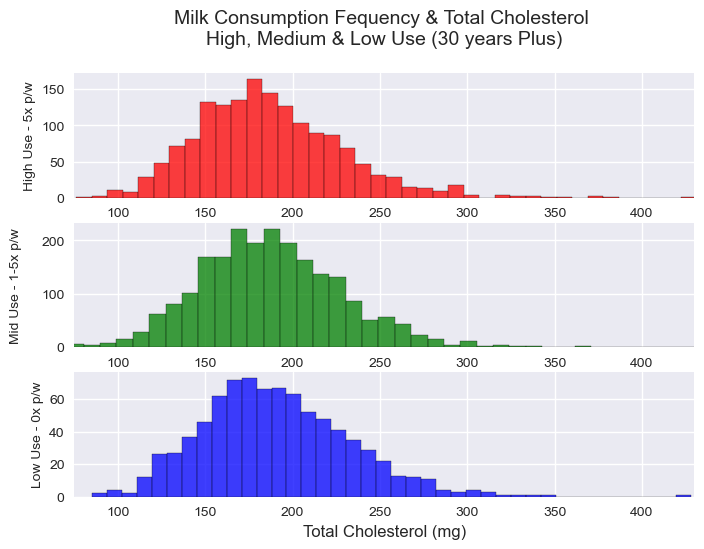

In [509]:
plt.subplot(3,1,1)
plt.title('Milk Consumption Fequency & Total Cholesterol \nHigh, Medium & Low Use (30 years Plus)\n', fontsize=14)
plt.ylabel('High Use - 5x p/w')
plt.hist(high_use['CHOL_mg'], 40, facecolor='r', edgecolor='black', alpha=0.75)
plt.xlim(75, 430) # Setting the x axis limits to 75 and 430 based on the above values. 

plt.subplot(3,1,2)
plt.ylabel('Mid Use - 1-5x p/w\n')
plt.hist(mid_use['CHOL_mg'], 40, facecolor='g', edgecolor='black', alpha=0.75)
plt.xlim(75, 430) # Setting the x axis limits to 75 and 430 based on the above values. 

plt.subplot(3,1,3)
plt.title('')
plt.ylabel('Low Use - 0x p/w')
plt.hist(low_use['CHOL_mg'], 40, facecolor='b', edgecolor='black', alpha=0.75)
plt.xlabel('Total Cholesterol (mg)', size=12)
plt.xlim(75, 430) 

plt.show()

In [547]:
from bokeh.plotting import figure, show
output_notebook()


x = high_use['CHOL_mg']
y = mid_use['CHOL_mg']
z = low_use['CHOL_mg']


p1 = figure(width=670, height=400,
           title="High Use of Milk")

# Histogram
bins = np.linspace(75, 430, 40)
hist, edges = np.histogram(x, density=True, bins=bins)
p1.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color="skyblue", line_color="white",
         legend_label="High Use of Milk")

p1.xaxis.axis_label = "x"
p1.yaxis.axis_label = "High Use"


p2 = figure(width=670, height=400,
           title="Medium Use of Milk")

# Histogram
bins = np.linspace(75, 430, 40)
hist, edges = np.histogram(y, density=True, bins=bins)
p2.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color="skyblue", line_color="white",
         legend_label="Medium Use of Milk")

p2.xaxis.axis_label = "x"
p2.yaxis.axis_label = "Medium Use"



# Histogram
bins = np.linspace(75, 430, 40)
hist, edges = np.histogram(z, density=True, bins=bins)
p3.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
         fill_color="skyblue", line_color="white",
         legend_label="Low Use of Milk")

p3.xaxis.axis_label = "x"
p3.yaxis.axis_label = "Low Use"

grid =  gridplot([[p1, p2]], width=400, height=300)

show(column(grid))


Loading BokehJS ...

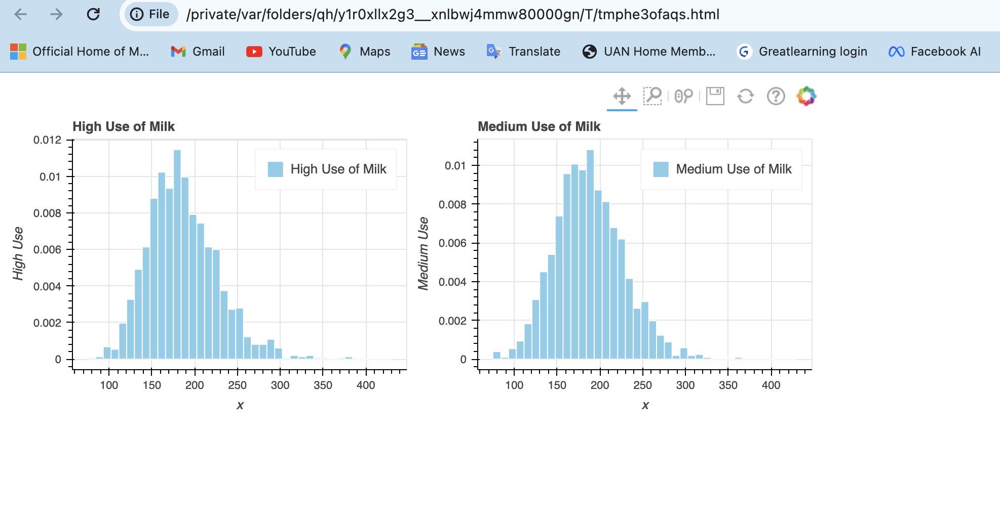

In [510]:
df_consolidated.head()

,SEQN,DIET,MILK_CONS,MILK_USE,MILK_TYPE,GENDER,AGE_YR,BIRTH_COUNTRY,EDU_LVL,MAR_STAT,INCOM_RATIO,WEIGHT,HEIGHT,BMI,WAIST,CHOL_mg,SYS_MEAN,DIA_MEAN
0,109264,Unknown,>= Once per day,Unknown,Dairy 1%,Female,13.0,USA,Unknown,Unknown,0.83,42.2,154.7,17.6,63.8,166.0,108.00,67.00
1,109266,Good,>= Once per week,1-5 Times per week,Other,Female,29.0,Others,College Grad and above,Never Married,5.00,97.1,160.2,37.8,117.9,195.0,99.00,54.33
2,109270,Unknown,>= Once per day,Unknown,Dairy 2%,Female,11.0,USA,Unknown,Unknown,1.88,75.3,156.0,30.9,91.4,103.0,124.67,73.33
3,109271,Good,<= Once per week,0 Times per week,Dairy Regular,Male,49.0,USA,12th Grade,Never Married,NaN,98.8,182.3,29.7,120.4,147.0,107.00,67.00
4,109273,Fair,<= Once per week,0 Times per week,Mixed,Male,36.0,USA,AA Degree,Never Married,0.83,74.3,184.2,21.9,86.8,164.0,113.67,67.33


In [513]:
#Demographic Analysis 
Plus_30_condition = df_consolidated.AGE_YR >= 30
Plus_30 = df_consolidated.loc[Plus_30_condition, ['GENDER', 'AGE_YR', 'EDU_LVL', 'MAR_STAT', 'INCOM_RATIO']]
Plus_30.head()

,GENDER,AGE_YR,EDU_LVL,MAR_STAT,INCOM_RATIO
3,Male,49.0,12th Grade,Never Married,NaN
4,Male,36.0,AA Degree,Never Married,0.83
5,Male,68.0,AA Degree,Never Married,1.20
8,Male,76.0,College Grad and above,Married/Partner,3.61
9,Female,68.0,College Grad and above,Widowed/Divorced,5.00


In [514]:
#Missing Value Analysis
missing_values=pd.DataFrame(Plus_30.isna().sum().reset_index())
missing_values.columns = ['Features','Missing count']
missing_values['% missing']= round(missing_values['Missing count'] / Plus_30.shape[0] * 100.00,2)
missing_values

,Features,Missing count,% missing
0,GENDER,0,0.00
1,AGE_YR,0,0.00
2,EDU_LVL,0,0.00
3,MAR_STAT,0,0.00
4,INCOM_RATIO,573,12.28


In [515]:
Plus_30.dropna(inplace=True)
Plus_30.isna().apply([np.sum])

,GENDER,AGE_YR,EDU_LVL,MAR_STAT,INCOM_RATIO
sum,0,0,0,0,0


In [516]:
#Unique values in each of the columns of Object Datatype and the number of observations 
#These are categorical variables
for column in Plus_30.columns:
    if Plus_30[column].dtype == 'object':
        print(column.upper(),': ',Plus_30[column].nunique())
        print(Plus_30[column].value_counts().sort_values())
        print('\n')

GENDER :  2
Female    2039
Male      2055
Name: GENDER, dtype: int64


EDU_LVL :  6
Unknown                      3
9th Grade                  275
12th Grade                 456
High School Grad           961
College Grad and above    1045
AA Degree                 1354
Name: EDU_LVL, dtype: int64


MAR_STAT :  4
Unknown                3
Never Married        501
Widowed/Divorced    1041
Married/Partner     2549
Name: MAR_STAT, dtype: int64




#### Let us remove the unknown values

In [517]:
unknown = Plus_30.MAR_STAT == 'Unknown'
Plus_30.loc[unknown,:].index.values
Plus_30.drop(Plus_30.loc[unknown,:].index.values, axis=0, inplace=True)
Plus_30.MAR_STAT.value_counts()

Married/Partner     2549
Widowed/Divorced    1041
Never Married        501
Name: MAR_STAT, dtype: int64

In [519]:
unknown = Plus_30.EDU_LVL == 'Unknown'
Plus_30.loc[unknown,:].index.values
Plus_30.drop(Plus_30.loc[unknown,:].index.values, axis=0, inplace=True)
Plus_30.EDU_LVL.value_counts()

AA Degree                 1354
College Grad and above    1044
High School Grad           961
12th Grade                 455
9th Grade                  275
Name: EDU_LVL, dtype: int64

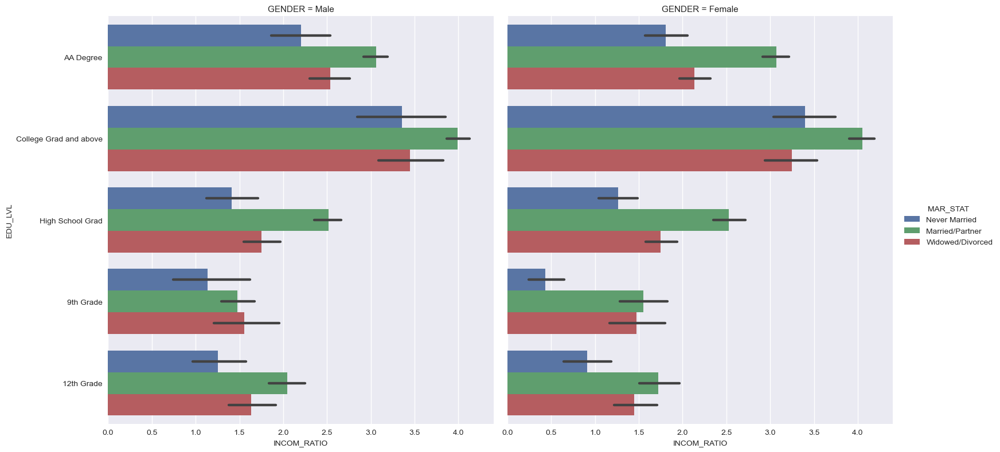

In [520]:
sns.catplot(data = Plus_30,
            y='EDU_LVL',
            x='INCOM_RATIO',
            kind='bar',
            height=8,
            hue='MAR_STAT',
            col='GENDER'
           )

plt.show();

#### Average earnings of Married people or people living with a partner is higher than the other categories like Single or Divorced.
#### The below violin plot also confims the same. The white dots are the means and we can see the variations classified by the degree and the color coding of marital status.
#### We can see that the grouping/concentration of the income is on the higher level for college grads. The school level pass are all concentrated around the the lower end of the band.

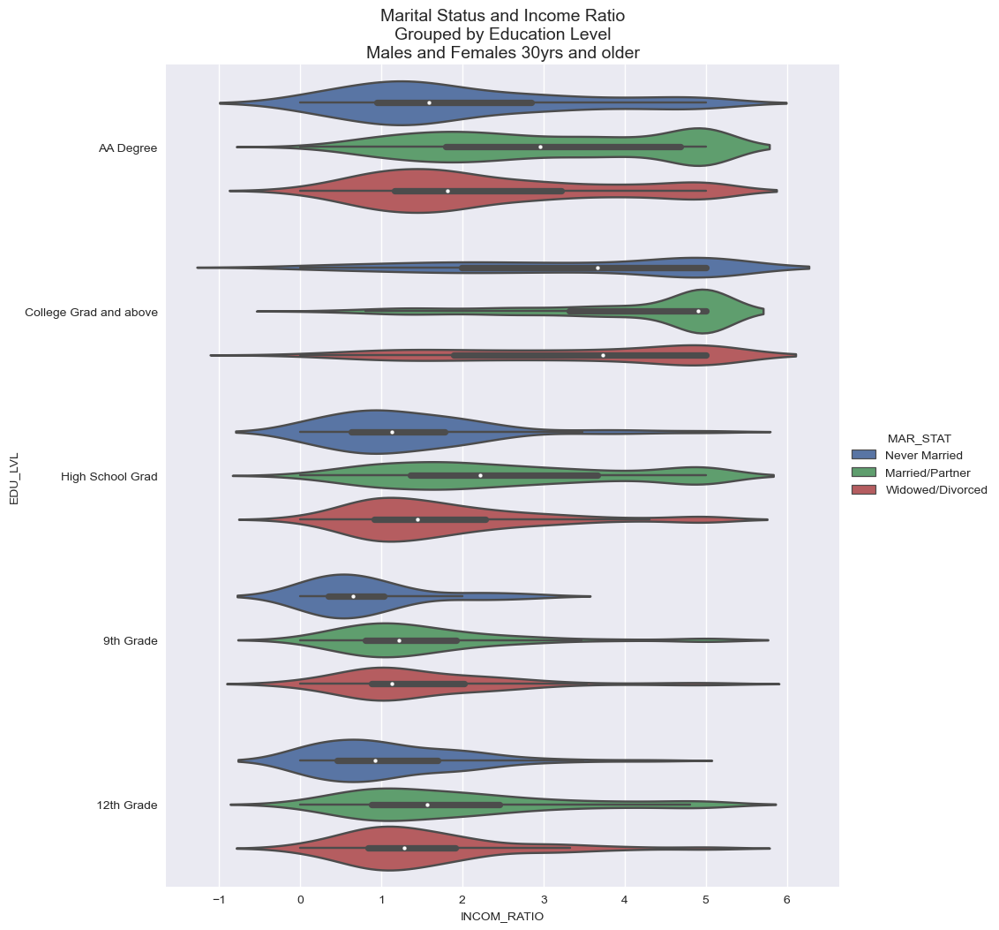

In [526]:
sns.catplot(data = Plus_30, 
            y='EDU_LVL', 
            x='INCOM_RATIO', 
            kind='violin', 
            height=10,
            hue='MAR_STAT',
           )

plt.title('Marital Status and Income Ratio\nGrouped by Education Level\nMales and Females 30yrs and older', 
          fontsize=14)
plt.show();

In [554]:
import plotly.io as pio
pio.renderers.default='notebook'

title = 'Marital Status and Income Ratio\nGrouped by Education Level\nMales and Females 30yrs and older'

figure = px.box(Plus_30, x='EDU_LVL', y='INCOM_RATIO', color='MAR_STAT', 
             facet_row='GENDER', boxmode='group', notched=True, title=title)

figure.show();

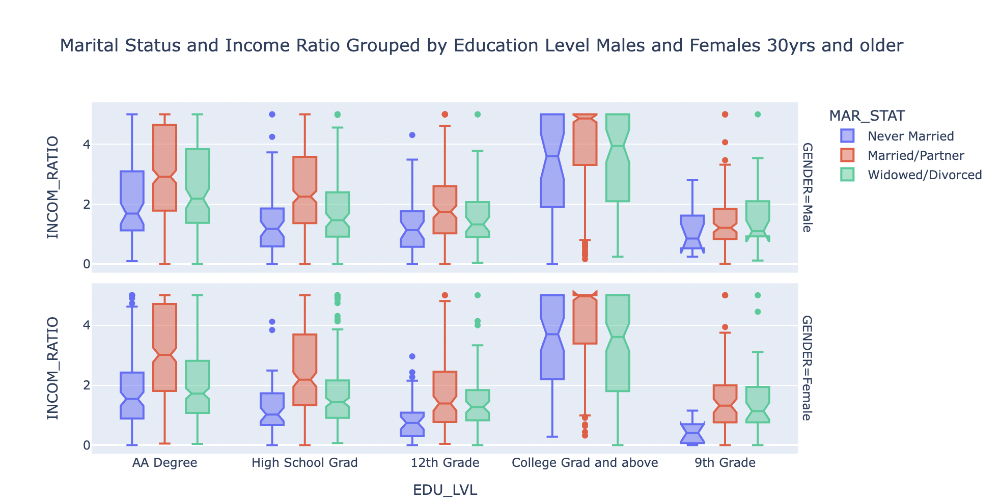

### Conclusion


<p style="color:#20568B; font-size:15px";>
We have thus performed a data mining from the 5 datasets downloaded from the given link (NHANES study). We have individually loaded each of the datasets and performed Data Wrangling to make the dataset ready for further analysis. We have eliminated the null values where required without affecting the loss of information, we have ingested the missing values with the appropriate measure of central tendency, grouped subsets of the dataframe into custom groups to analyze them further. We have also combined all the five data frames and performed exploratory data analysis, correlations, missing data analysis, outliers, treatment, noramlizing the data values using z-score and also visualized the various combination of variables to infer and cull out insights</p>

<p style="color:#20568B; font-size:15px";>
We have found the relationship between the BMI and other health parametes, demographic data deep dive and also the cholestrol levels of the person in raltion to the type of milk consumed and the frequency of milk consumed. All the inferences are given inline after the analysis is done above.</p>

<p style="color:#20568B; font-size:15px";>
We have also in this data mining exercise, created interactive plots using Bokeh and Plotly.</p>

**References**

* Minimilast Data Wrangling with Python (v1.0.3.9011), Marek Gagolewski, Missing, censored, and questionable data, https://datawranglingpy.gagolewski.com/chapter/520-missingness.html, accessed 26th January 2024.
* Minimilast Data Wrangling with Python (v1.0.3.9011), Marek Gagolewski, Processing Data in Groups, https://datawranglingpy.gagolewski.com/chapter/430-group-by.html, accessed 26th January 2024.
* Bokeh Documentation, https://docs.bokeh.org/en/latest/index.html, accessed 27th January 2024.
* Bokeh Documentation, https://docs.bokeh.org/en/latest/docs/gallery.html#gallery, accessed 27th January 2024.
* Demographic Dataset, https://wwwn.cdc.gov/nchs/nhanes/search/datapage.aspx?Component=Demographics&Cycle=2017-2020, accessed 26th January 2024.
* Cholestrol Dataset,https://wwwn.cdc.gov/nchs/nhanes/search/datapage.aspx?Component=Laboratory&Cycle=2017-2020, accessed 26th January 2024.
* Body Measurement Dataset,https://wwwn.cdc.gov/nchs/nhanes/search/datapage.aspx?Component=Examination&Cycle=2017-2020, accessed 26th January 2024.
* Blood Pressure Dataset,https://wwwn.cdc.gov/nchs/nhanes/search/datapage.aspx?Component=Examination&Cycle=2017-2020, accessed 26th January 2024.
* Diet Behaviour Dataset,https://wwwn.cdc.gov/nchs/nhanes/search/datapage.aspx?Component=Examination&Cycle=2017-2020, accessed 26th January 2024.

